In [14]:
import scipy as sp
from scipy import signal
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import scipy.io as sio
from scipy.interpolate import interp1d
import math
from scipy import stats
import glob
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC 
import shutil
import os
from sklearn.metrics import roc_auc_score
import warnings
warnings.filterwarnings('ignore')

import matplotlib.pylab as pylab
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (10, 4),
         'axes.labelsize': 'large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'large',
         'ytick.labelsize':'large'}
pylab.rcParams.update(params)

# Load data and setup

In [15]:
from analysis_functions import *
from plotting_functions import *

### Define parameters

In [16]:
monkey = 'Stanton'

In [17]:
# PATHS
datapath = 'E:\\two_boundary\\original_data\\'
figpath = 'E:\\two_boundary\\figures\\'
datapathsave = 'E:\\two_boundary\\data\\'

brain_areas = ['MT', 'MST', 'LIP', 'SC']

# BRAIN AREAS
#if monkey == 'Neville':
#    brain_areas = ['MT', 'MST', 'LIP']
#else:
#    brain_areas = ['MST', 'LIP']

# BINNING/SMOOTHING PARAMETERS
bins = np.arange(-500, 3051)
sm_std = 30 # gaussian smoothing stdev
bin_size = 100 # msec for binend data

# MIN NUM TRIALS FOR INCLUSION
min_ntrials = 5

# MIN NEURON RATING FOR INCLUSION
min_rating = 2.5

## PSTH

In [18]:
for area in brain_areas[3:4]:
    
    trials_per_dir_all = {}
    
    currpath = datapath + monkey + '\\' + area
    os.chdir(currpath)
    
    figpath_good = figpath + 'psth\\' +  monkey + '\\' + area + '\\' + '\\good_neurons\\'
    figpath_bad = figpath + 'psth\\' +  monkey + '\\' + area + '\\bad_neurons\\'
    datapath_good = datapathsave + monkey + '\\' + area + '\\good_neurons\\'
    datapath_bad = datapathsave + monkey + '\\' + area + '\\bad_neurons\\'
    
    make_dirs(figpath_good)
    make_dirs(figpath_bad)
    make_dirs(datapath_good)
    make_dirs(datapath_bad)
    
    filelist = [f for f in glob.glob("*merged_w_ratings.mat")]
    n_files = len(filelist)
    
    # Pre-allocate
    all_ratings = []
    mean_firing_rates = []

    # Loop over files (datasets)
    for file in filelist[-2:]:
        bhv = sio.loadmat(file)['data']['BHV'] # data from monkeylogic bhv files
        neuro = sio.loadmat(file)['data']['NEURO'] # data from neural nex file   

        date = file[8:18] # date of recording session
        
        conditions = bhv[0][0][0][0][3][0] # list of conditions per trial
        errors = bhv[0][0][0][0][5] # list of errors per trial
        code_times = [i[0] for i in neuro[0][0][0][0][2]] # list of code times for each trial
        code_numbers = [i[0] for i in neuro[0][0][0][0][3]] # list of code numbers for each trial

        trial_starts = [i for i, val in enumerate(code_numbers) if val == STRT_TRIAL]

        n_neurons = len(neuro[0][0][0][0][1][0][0]) # list of all neurons from session

        # Loop over neurons
        for i_neuron in range(n_neurons):
            neuron_name = neuro[0][0][0][0][1][0][0].dtype.names[i_neuron]
            
            if neuron_name[-1] != 'f':
                rating = neuro[0][0][0][0]['ratings'][i_neuron][1][0][0]#neuro[0][0][0][0][-2][i_neuron][1][0][0]
                ap = 1#neuro[0][0][0][0][-1][0][0][0][0][0]
                ml = 1#neuro[0][0][0][0][-1][0][0][1][0][0]
                depth = 1#neuro[0][0][0][0][-1][0][0][3][i_neuron][0]

                spikes = [i[0] for i in neuro[0][0][0][0][1][0][0][i_neuron]] # array of spike times (relative to session start)    
                
                [raw_spikes, mean_psth_raw, mean_psth_sm, binned_spikes, trials_per_dir] = get_psth(spikes, errors, trial_starts, conditions, code_numbers, code_times, bins, sm_std, bin_size)
                
                if min(trials_per_dir) >= min_ntrials:
                    if rating >= min_rating:       
                        fname_fig = figpath_good + date + '_' + neuron_name + '.png'
                        fname_data = datapath_good + date + '_' + neuron_name + '.mat'
                        plot_psth(mean_psth_sm, bins[0:-1], fname_fig, sm_std)
                    else:
                        fname_fig = figpath_bad + date + '_' + neuron_name + '.png'
                        fname_data = datapath_bad + date + '_' + neuron_name + '.mat'
                        plot_psth(mean_psth_sm, bins[0:-1], fname_fig, sm_std)

                    sp.io.savemat(fname_data,  {'mean_psth_sm': mean_psth_sm, 'mean_psth_raw': mean_psth_raw, 'raw_spikes': raw_spikes,
                                   'binned_spikes': binned_spikes, 'bins_raw': bins, 'bin_size_binning': bin_size, 'spike_train': spikes, 'coords': [ap, ml, depth]}) 
                
                trials_per_dir_all[date + '_' + neuron_name] = trials_per_dir
                
        csv_name = datapath + monkey + '\\' + area + '_trials_per_dir.csv'        
        with open(csv_name, 'w') as f:
            for key in trials_per_dir_all.keys():
                f.write("%s,%s\n"%(key,trials_per_dir_all[key]))
        

# Identify task-responsive neurons


In [19]:
for area in brain_areas[3:]:
    
    currpath = datapathsave + monkey + '\\' + area + '\\good_neurons\\'
    currfigpath = figpath + 'psth\\' + monkey + '\\' + area + '\\good_neurons\\'

    os.chdir(currpath)
    filelist = [f for f in glob.glob("*.mat")]

    [pvals, fr] = get_task_responsive_cells(filelist, bins, currfigpath)
    

# Identify neuron doubles

In [20]:
for area in brain_areas[3:4]: 
    
    currfigpath = figpath + 'psth\\' + monkey + '\\' + area + '\\good_neurons\\task_responsive\\'
    os.chdir(currfigpath)
    make_dirs('doubles')
    files = glob.glob('doubles/*')
    for f in files:
        os.remove(f)
            
    currpath = datapathsave + monkey + '\\' + area + '\\good_neurons\\task_responsive\\'
    os.chdir(currpath)
    filelist = [f for f in glob.glob("*.mat")]
    n_files = len(filelist)

    dates = np.unique([i[0:10] for i in filelist])  
    make_dirs('doubles')
    files = glob.glob('doubles/*')
    for f in files:
        os.remove(f)
            
    for i_date, date in enumerate(dates):
        curr_files = [f for f in glob.glob(date + '*')]
        
        to_remove = []
        
        if len(curr_files) > 2:
            neuron_pairs = list(itertools.combinations(curr_files, 2))
            
            for i_pair, pair in enumerate(neuron_pairs):

                file1 = pair[0]
                file2 = pair[1]

                data1 = sio.loadmat(file1)['spike_train'][0]
                data2 = sio.loadmat(file2)['spike_train'][0]
                
                if (len(np.intersect1d(data1, data2))/len(data1)) > 0.5:
                    if len(data1) > len(data2):
                        to_remove.append(pair[1])
                    else:
                        to_remove.append(pair[0])
        to_remove = np.unique(to_remove)
        to_remove_figs = [i[:-3] + 'png' for i in to_remove]
        
        [shutil.move(i, 'doubles') for i in to_remove]
        
        os.chdir(currfigpath)
        [shutil.move(i, 'doubles') for i in to_remove_figs]
        
        os.chdir(currpath)
        

# Quantify single-neuron direction selectivity

# Quantify single-neuron category selectivity (rCTI)

## Setup

In [518]:
DIRS = np.array(DIRS)
BCD_pairs = [[22.5, 157.5], [247.5, 112.5], [202.5, 337.5], [67.5, 292.5], [67.5, 112.5], [202.5, 157.5], [247.5, 292.5], [22.5, 337.5]]
BCD_pairs_indx = [[np.where(DIRS == i[0])[0][0], np.where(DIRS == i[1])[0][0]] for i in BCD_pairs]

WCD_pairs = [[337.5, 112.5], [157.5, 292.5], [67.5, 202.5], [247.5, 22.5], [22.5, 67.5], [202.5, 247.5], [112.5, 157.5], [292.5, 337.5]]
WCD_pairs_indx = [[np.where(DIRS == i[0])[0][0], np.where(DIRS == i[1])[0][0]] for i in WCD_pairs]

step_size = 10 # step size for sliding window ROC analysis (in ms)

# Get number of neurons per area
n_neurons = {}
for area in brain_areas:
    datadir = datapathsave + monkey + '\\' + area + '\\good_neurons\\task_responsive\\'
    os.chdir(datadir)
    n_neurons[area] = len([f for f in glob.glob("*.mat")])

## rCTI sliding window

### rCTI for all neurons

In [519]:
monkey = 'Stanton'

In [520]:
DIRS = np.array(DIRS)
BCD_pairs = [[22.5, 157.5], [247.5, 112.5], [202.5, 337.5], [67.5, 292.5]]
BCD_pairs_indx = [[np.where(DIRS == i[0])[0][0], np.where(DIRS == i[1])[0][0]] for i in BCD_pairs]

WCD_pairs = [[337.5, 112.5], [157.5, 292.5], [67.5, 202.5], [247.5, 22.5]]
WCD_pairs_indx = [[np.where(DIRS == i[0])[0][0], np.where(DIRS == i[1])[0][0]] for i in WCD_pairs]

In [522]:
rCTI_sliding_window_all = {}
rCTI_mean = {}
rCTI_std = {}

for area in brain_areas: 
    currpath = datapathsave + monkey + '\\' + area + '\\good_neurons\\task_responsive\\'

    os.chdir(currpath)
    filelist = [f for f in glob.glob("*.mat")]
    n_files = len(filelist)

    rCTI_all = [[] for i in range(n_files)]

    for i, file in enumerate(filelist):
        #data = sio.loadmat(file)['binned_spikes'][0]
        data = sio.loadmat(file)['binned_spikes'][0]
        bins = sio.loadmat(file)['bins_raw'][0][0:-1]
        
        psth_by_dir = [[] for i in range(N_DIRS)]
        for ii, val in enumerate(np.arange(0, N_CONDS_DMC, 6)):
            psth_by_dir[ii] = np.vstack([iii for iii in data[val:val+6] if len(iii)> 0])
            
        [WCD_roc_all, WCD_roc] = get_WC_BC_ROC(psth_by_dir, WCD_pairs_indx, step_size)
        [BCD_roc_all, BCD_roc] = get_WC_BC_ROC(psth_by_dir, BCD_pairs_indx, step_size)
    
        rCTI_all[i] = BCD_roc-WCD_roc
    
    rCTI_sliding_window_all[area] = np.squeeze(rCTI_all)
    rCTI_mean[area] = np.mean(rCTI_all, 0)
    rCTI_std[area] = sp.stats.sem(rCTI_all, 0)
    
savepath = figpath + 'rCTI\\' + monkey + '_rCTI.mat'
sp.io.savemat(savepath,  {'rCTI_all': rCTI_sliding_window_all, 'rCTI_mean': rCTI_mean, 'rCTI_std': rCTI_std})
    

In [288]:
(rCTI_all[64])

[]

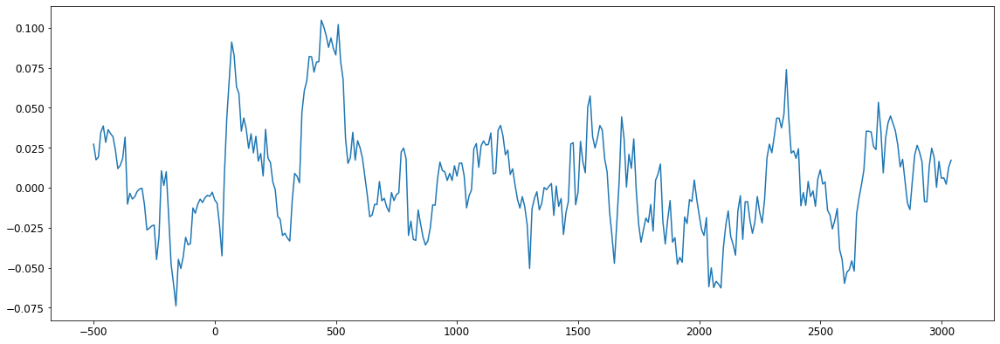

In [427]:
fig = plt.figure(figsize=(15, 5))
ax = fig.add_axes([1,1,1,1])

#ax.plot(rcti_n, 'r')
ax.plot(bins_rcti, BCD_roc-WCD_roc) 


In [302]:
BCD_pairs_indx

[[5, 6], [0, 8], [2, 9], [3, 11]]

In [325]:
pairs_indx = BCD_pairs_indx[0:1]
data = fake_data
n_timepoints_total = len(data[0][0])
n_timepoints_stepped = len(np.arange(0, n_timepoints_total, 10))

n_pairs = len(pairs_indx)

roc_all = np.zeros([n_pairs, n_timepoints_stepped])

for i_pair in range(n_pairs):
    min_nt = min([len(data[pairs_indx[i_pair][i]]) for i in range(2)])
    d = np.argmin([len(data[pairs_indx[i_pair][i]]) for i in range(2)])

    if d == 0:
        dir1 = data[pairs_indx[i_pair][0]]
        dir2 = data[pairs_indx[i_pair][1]][0:min_nt, :]
    else:
        dir1 = data[pairs_indx[i_pair][0]][0:min_nt, :]
        dir2 = data[pairs_indx[i_pair][1]]
            
    for i, timepoint in enumerate(np.arange(0, n_timepoints_total, step_size)):
        y_true = np.hstack([np.zeros(np.size(dir1, 0)), np.ones(np.size(dir2, 0))])
        y_data = np.hstack([dir1[:, timepoint], dir2[:, timepoint]])

        curr_roc = abs(roc_auc_score(y_true, y_data) - 0.5)
        roc_all[i_pair, i] = curr_roc

mean_roc = np.mean(roc_all, 0)

In [328]:
roc = roc_auc_score(y_true, y_data)

In [329]:
abs(roc-0.5)+0.5

1.0

In [318]:
roc_auc_score(y_true, y_data)

0.0

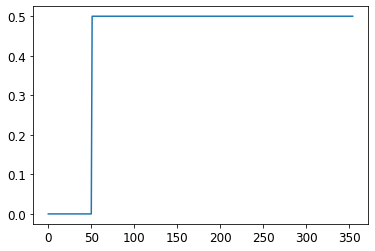

In [319]:
plt.plot(roc_all[0])

In [239]:
360-225.0

135.0

In [240]:
[i[1]-i[0] for i in WCD_pairs]

[-225.0, 135.0, 135.0, -225.0, 45.0, 45.0, 45.0, 45.0]

In [241]:
DIRS = np.array(DIRS)
BCD_pairs = [[22.5, 157.5], [247.5, 112.5], [202.5, 337.5], [67.5, 292.5]]
BCD_pairs_indx = [[np.where(DIRS == i[0])[0][0], np.where(DIRS == i[1])[0][0]] for i in BCD_pairs]

WCD_pairs = [[337.5, 112.5], [157.5, 292.5], [67.5, 202.5], [247.5, 22.5]]
WCD_pairs_indx = [[np.where(DIRS == i[0])[0][0], np.where(DIRS == i[1])[0][0]] for i in WCD_pairs]

In [313]:
fake_data = psth_by_dir
tmp_indx = np.where(bins > 0)[0]

for i, d in enumerate(psth_by_dir):
    
    tmp = np.zeros_like(d)
    
    if i < 6:
        tmp[:, tmp_indx] = 100
        
        #tmp[:, tmp_indx] = np.random.rand(len(tmp), len(tmp_indx))
        
        
    fake_data[i] = tmp
    
        

In [219]:
len(tmp)

19

In [249]:
[WCD_roc_all, WCD_roc] = get_WC_BC_ROC(fake_data, WCD_pairs_indx, step_size)
[BCD_roc_all, BCD_roc] = get_WC_BC_ROC(fake_data, BCD_pairs_indx, step_size)

rCTI7 = BCD_roc-WCD_roc

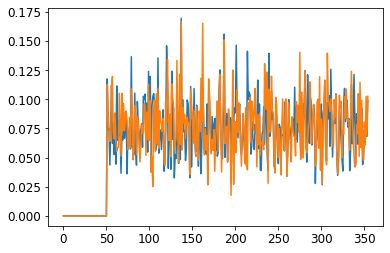

In [222]:
plt.plot(BCD_roc)
plt.plot(WCD_roc)

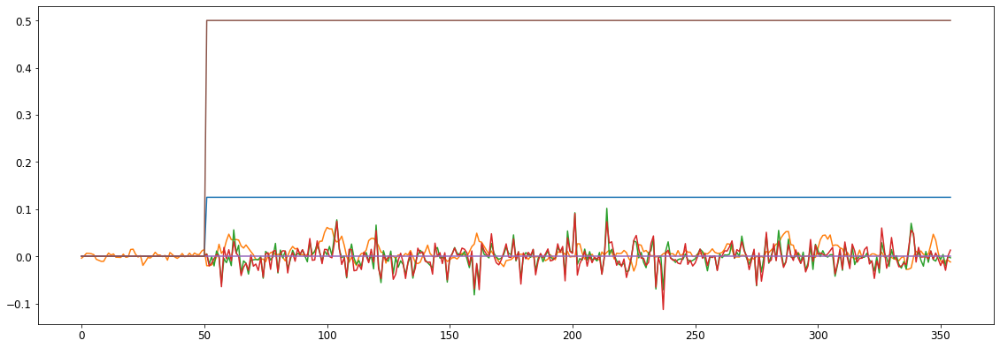

In [250]:
fig = plt.figure(figsize=(15, 5))
ax = fig.add_axes([1,1,1,1])
ax.plot(rCTI)
ax.plot(rCTI2)
ax.plot(rCTI3)
ax.plot(rCTI4)
ax.plot(rCTI6)
ax.plot(rCTI7)

In [233]:
def get_WC_BC_ROC(data, pairs_indx, step_size = 10):

    n_timepoints_total = len(data[0][0])
    n_timepoints_stepped = len(np.arange(0, n_timepoints_total, 10))

    n_pairs = len(pairs_indx)

    roc_all = np.zeros([n_pairs, n_timepoints_stepped])
    
    

    for i_pair in range(n_pairs):
        
        min_nt = min([len(data[pairs_indx[i_pair][i]]) for i in range(2)])
        d = np.argmin([len(data[pairs_indx[i_pair][i]]) for i in range(2)])
        
        if d == 0:
            dir1 = data[pairs_indx[i_pair][0]]
            dir2 = data[pairs_indx[i_pair][1]][0:min_nt, :]
        else:
            dir1 = data[pairs_indx[i_pair][0]][0:min_nt, :]
            dir2 = data[pairs_indx[i_pair][1]]
            
        for i, timepoint in enumerate(np.arange(0, n_timepoints_total, step_size)):
            y_true = np.hstack([np.zeros(np.size(dir1, 0)), np.ones(np.size(dir2, 0))])
            y_data = np.hstack([dir1[:, timepoint], dir2[:, timepoint]])

            curr_roc = abs(roc_auc_score(y_true, y_data) - 0.5)
            roc_all[i_pair, i] = curr_roc

    mean_roc = np.mean(roc_all, 0)

    return roc_all, mean_roc

0

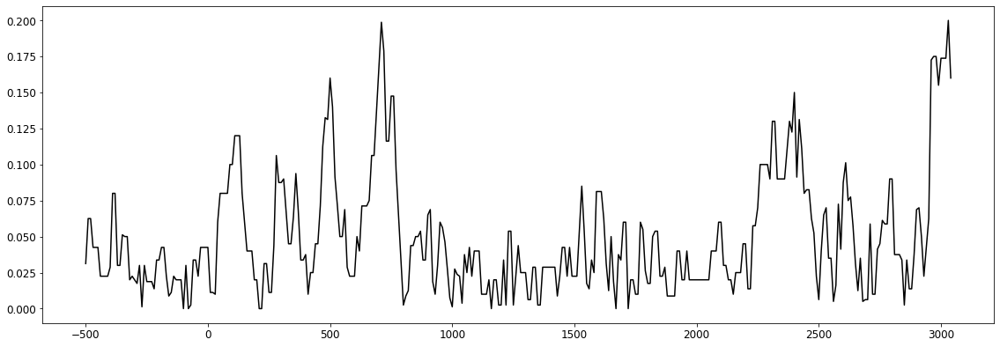

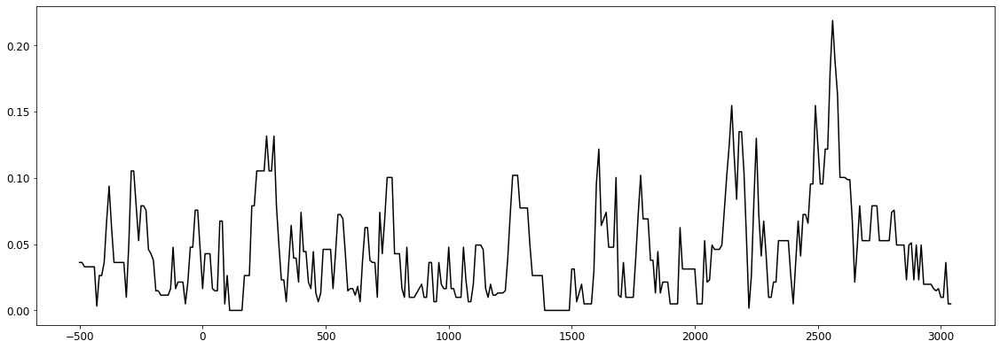

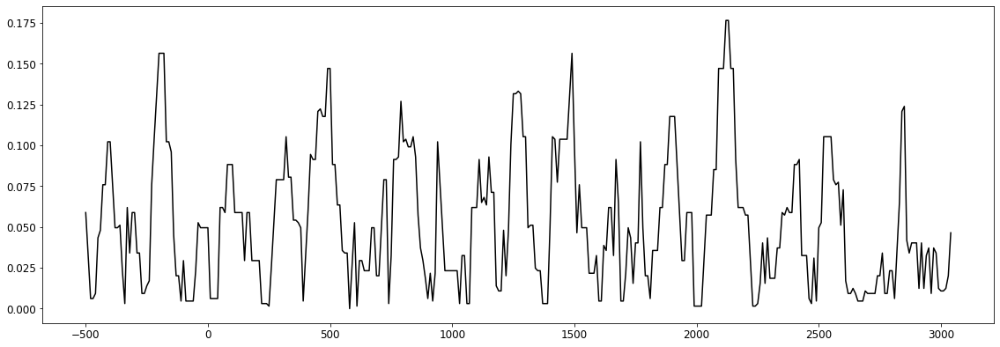

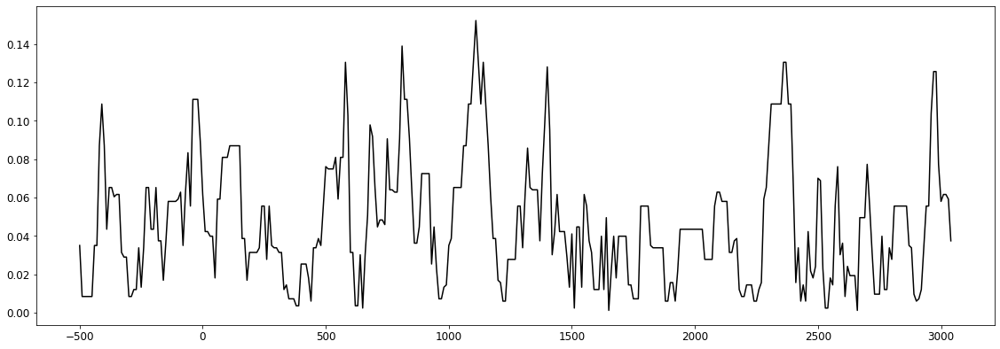

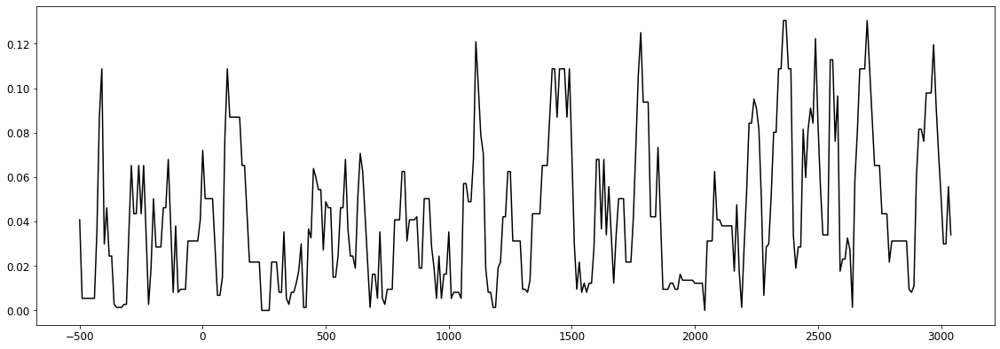

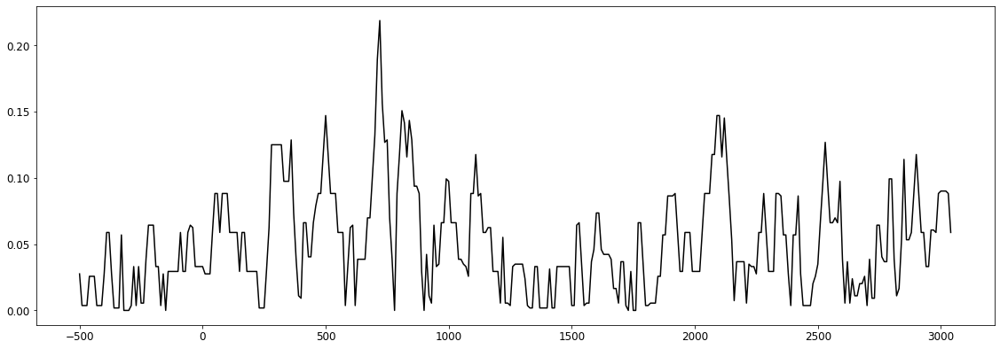

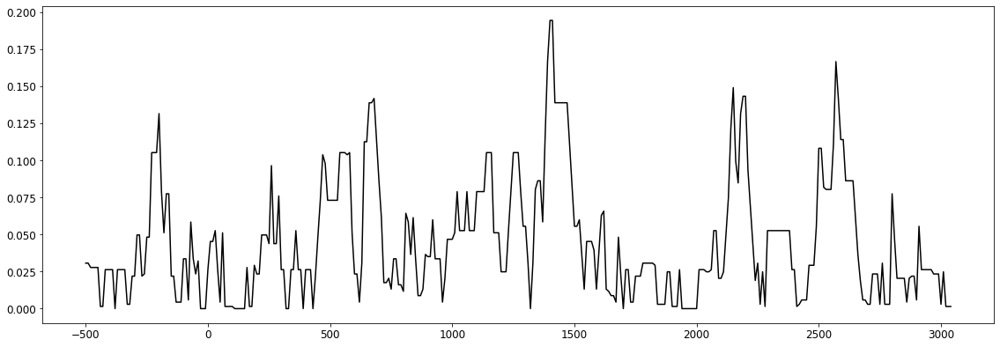

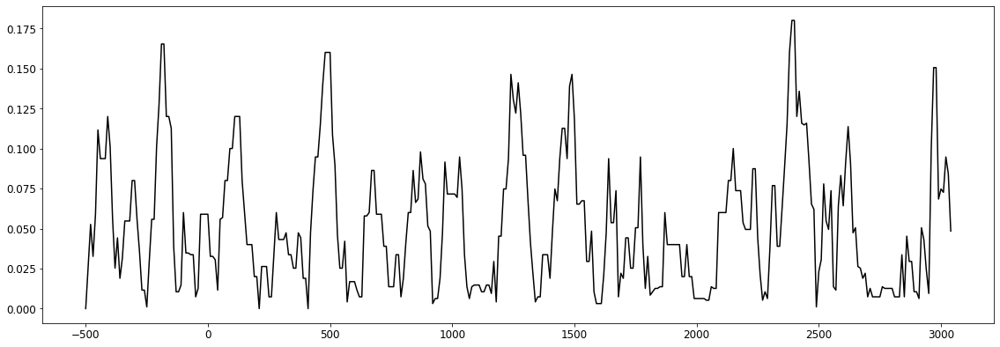

In [116]:


for i in range(8):
    
    fig = plt.figure(figsize=(15, 5))
    ax = fig.add_axes([1,1,1,1])
    ax.plot(bins_plotting, roc_all[i], 'k')
    

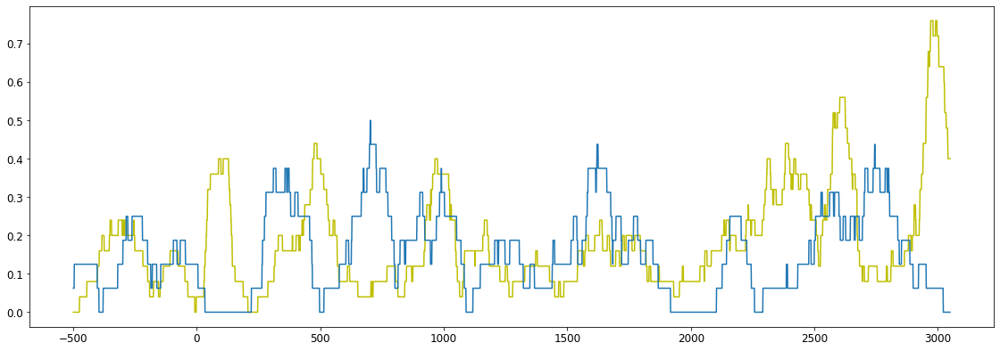

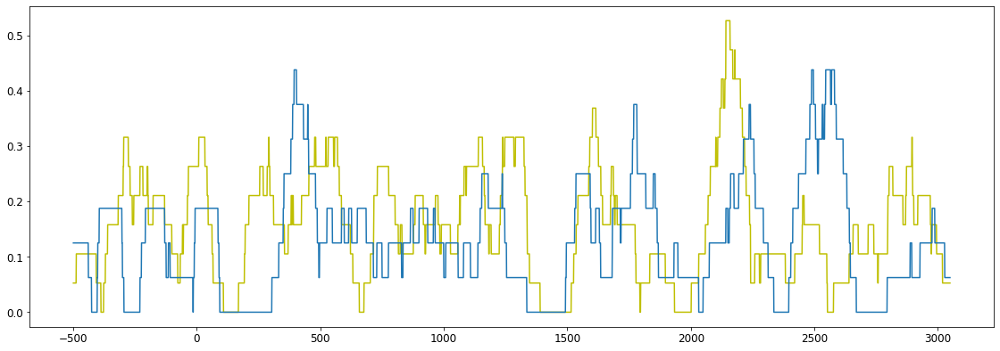

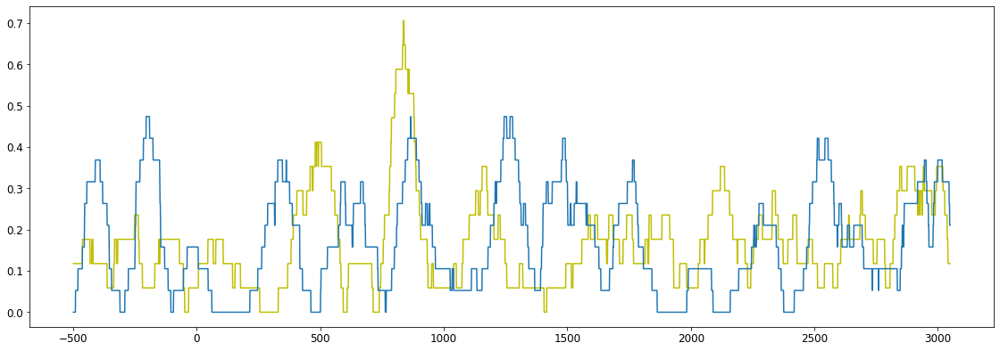

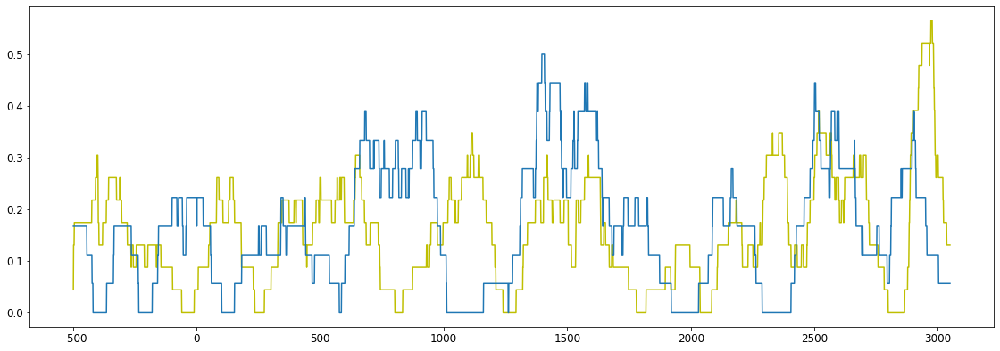

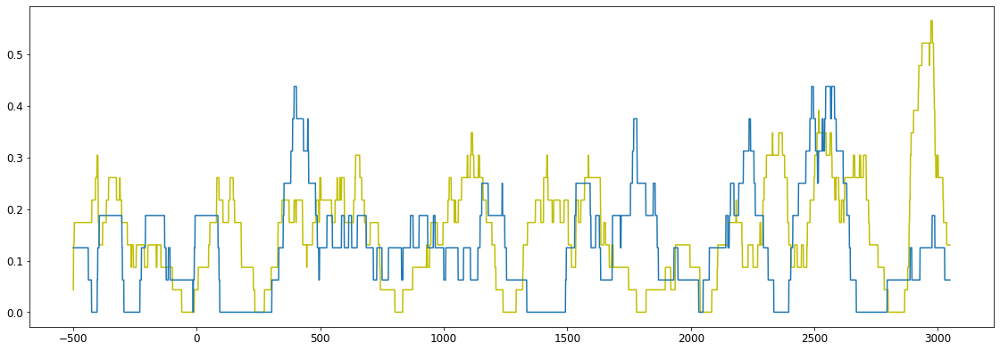

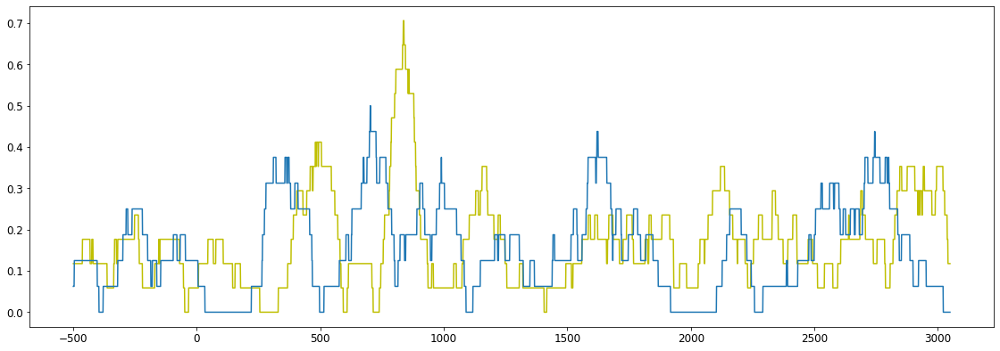

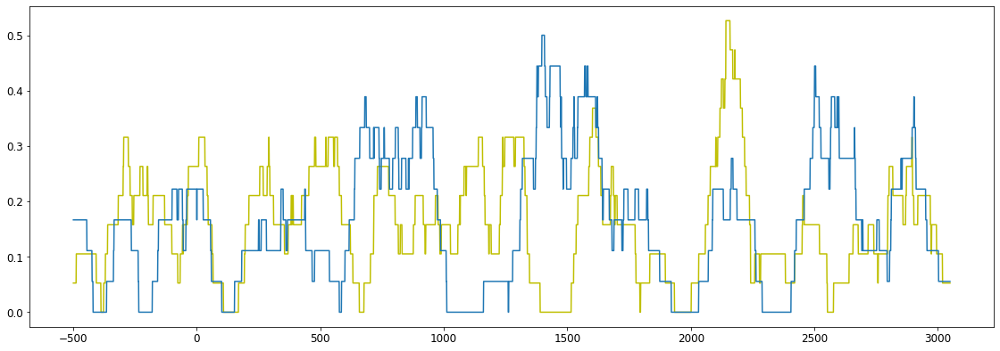

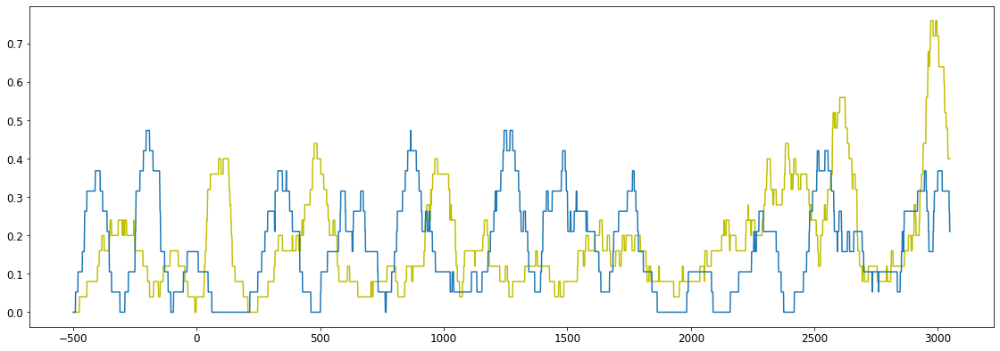

In [117]:

for pair in BCD_pairs_indx:
    
    fig = plt.figure(figsize=(15, 5))
    ax = fig.add_axes([1,1,1,1])

    
    ax.plot(bins, np.mean(psth_by_dir[pair[0]], 0), 'y')
    ax.plot(bins, np.mean(psth_by_dir[pair[1]], 0))

array([300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312,
       313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325,
       326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338,
       339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351,
       352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364,
       365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377,
       378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390,
       391, 392, 393, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403,
       404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416,
       417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429,
       430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442,
       443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455,
       456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467, 468,
       469, 470, 471, 472, 473, 474, 475, 476, 477, 478, 479, 48

In [473]:
t = ([np.mean(np.mean(psth_by_dir[i][:, bins[600:700]], 0))*100 for i in range(12)])
ord_ind = np.argsort(DIRS)
t2 = [t[i] for i in ord_ind]

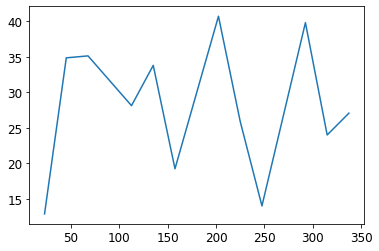

In [465]:
ord_dirs = [DIRS[i] for i in ord_ind]
plt.plot(ord_dirs, t2)

In [480]:
wm = np.hstack([np.mean(np.mean(psth_by_dir[i][:, 600:900], 1))*10 for i in range(N_DIRS)])
wsem = np.hstack([sp.stats.sem(np.mean(psth_by_dir[i][:, 600:900], 1))*10 for i in range(N_DIRS)])


In [478]:
data[10]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [483]:
plot_pv_tuning_curve(wm, wm, wsem, wsem, '200', 'E:\\two_boundary\\tmp')

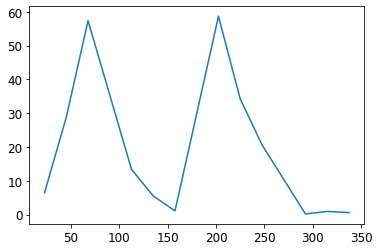

In [481]:
plt.plot(ord_dirs, wm)

In [472]:
wm

array([ 6.10512821,  6.43333333,  8.02666667,  2.21111111,  7.95555556,
        7.83333333, 24.85333333, 31.23333333, 39.41111111,         nan,
       28.18333333, 28.28333333])

(-50, 550)

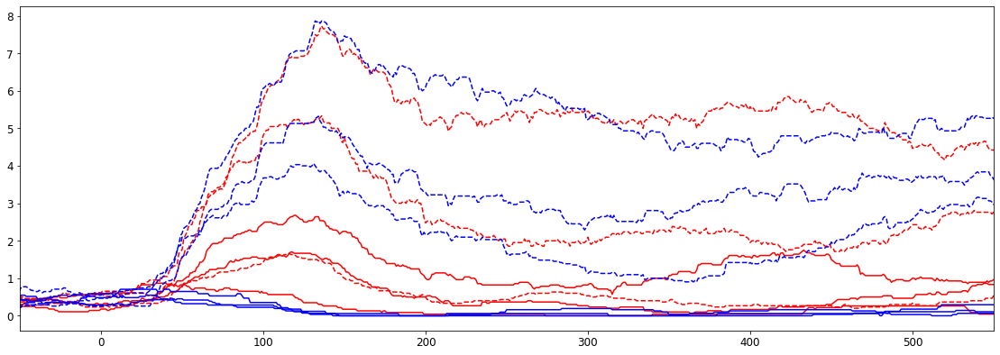

In [441]:
fig = plt.figure(figsize=(15, 5))
ax = fig.add_axes([1,1,1,1])

for i in range(0, 3):
    ax.plot(bins, np.mean(psth_by_dir[i], 0), '--r')

for i in range(3, 6):
    ax.plot(bins, np.mean(psth_by_dir[i], 0), 'r')
    
for i in range(6, 9):
    ax.plot(bins, np.mean(psth_by_dir[i], 0), '--b')
    
for i in range(9, 12):
    ax.plot(bins, np.mean(psth_by_dir[i], 0), 'b')
    
plt.xlim(-50, 550)


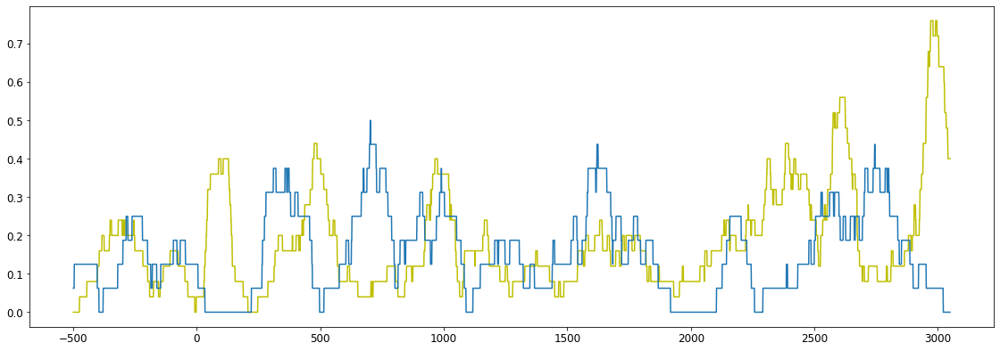

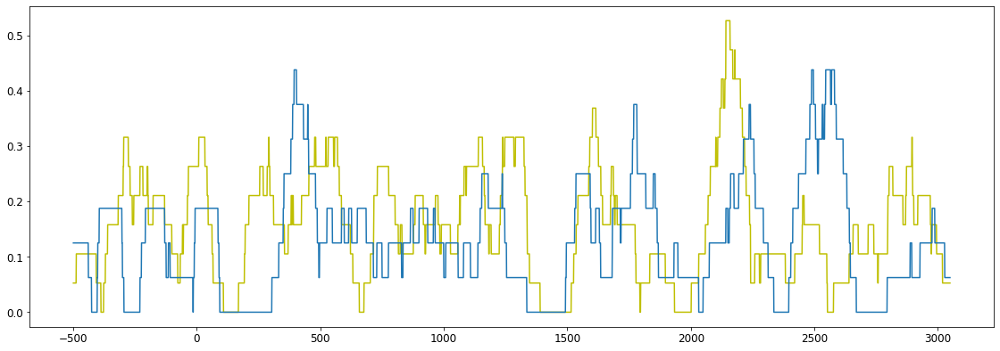

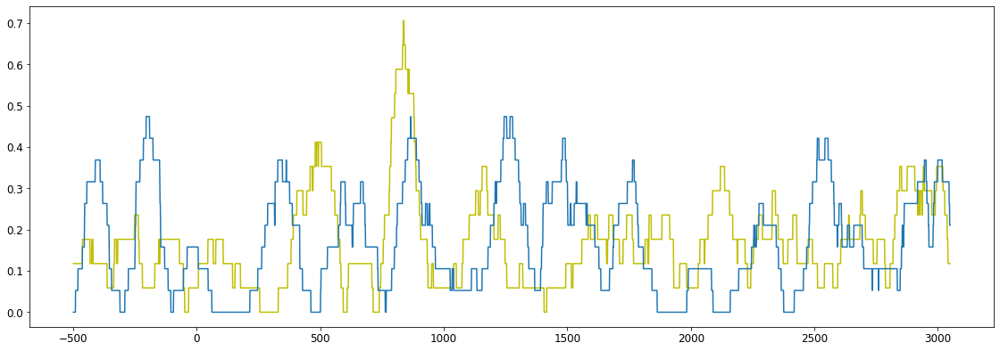

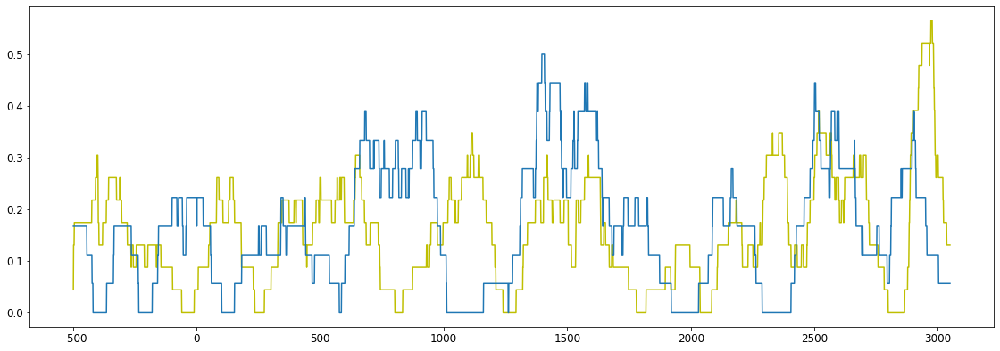

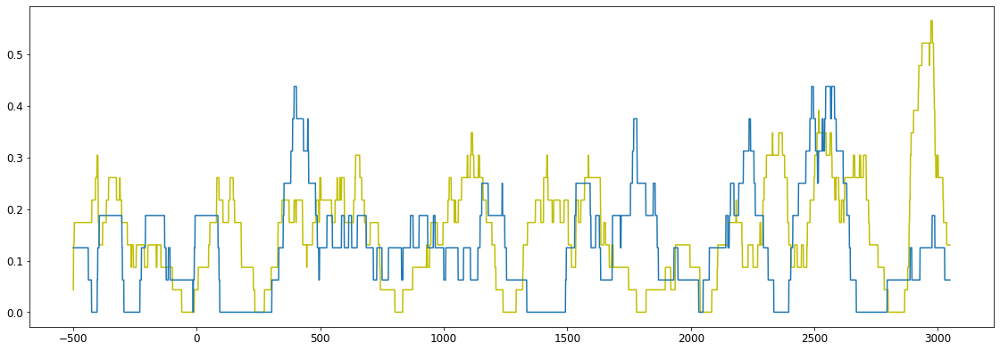

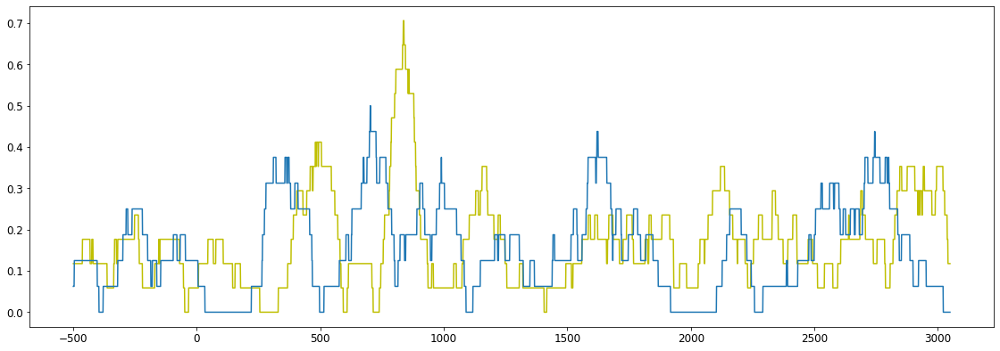

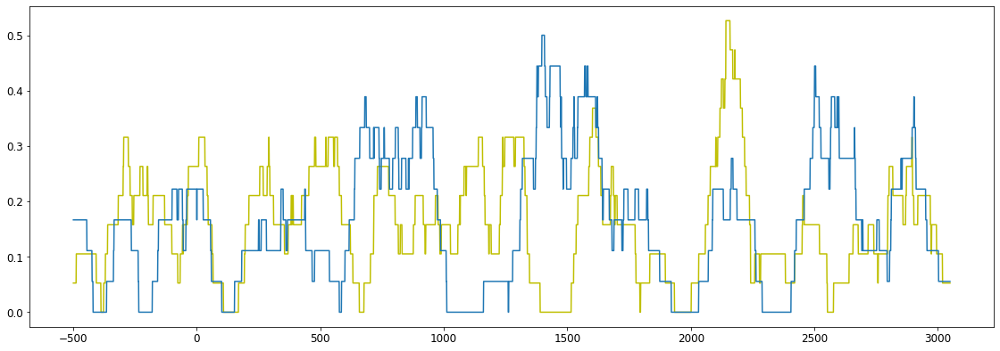

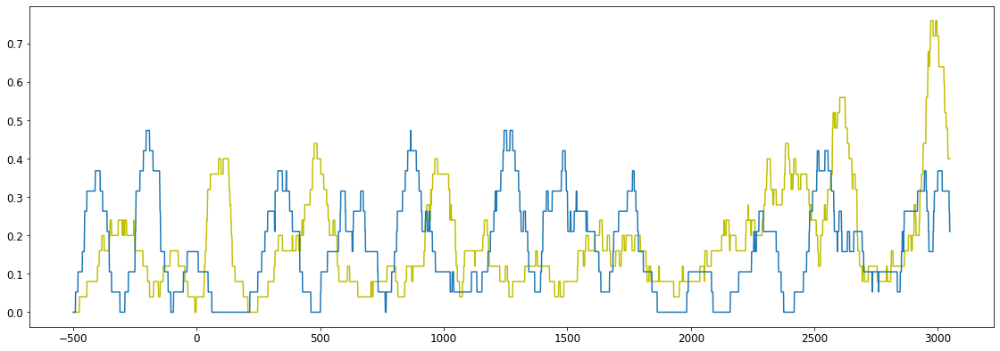

(-50, 200)

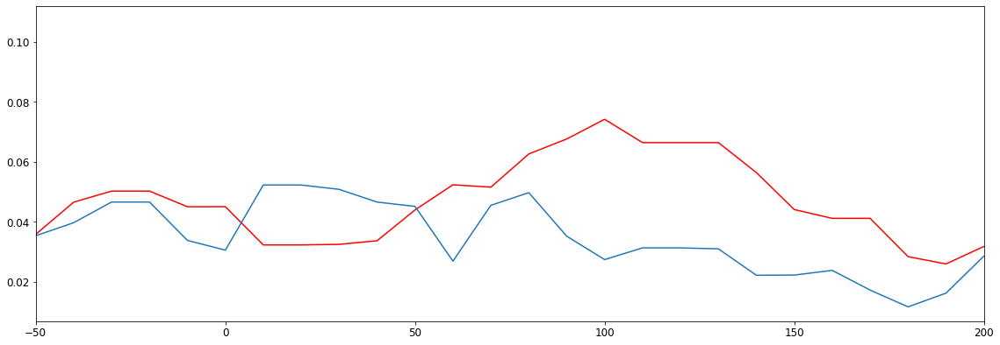

In [106]:
fig = plt.figure(figsize=(15, 5))
ax = fig.add_axes([1,1,1,1])
    
ax.plot(bins_plotting, BCD_roc, 'r')
ax.plot(bins_plotting, WCD_roc)

plt.xlim(-50, 200)


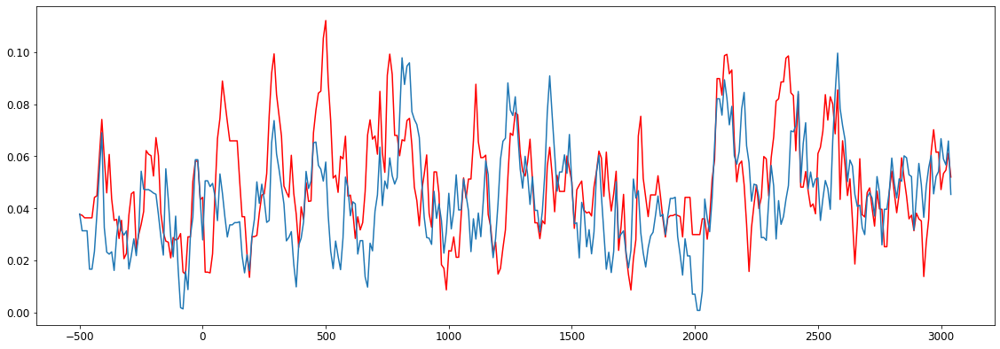

In [253]:
fig = plt.figure(figsize=(15, 5))
ax = fig.add_axes([1,1,1,1])
    
ax.plot(bins_plotting, BCD_roc, 'r')
ax.plot(bins_plotting, WCD_roc)

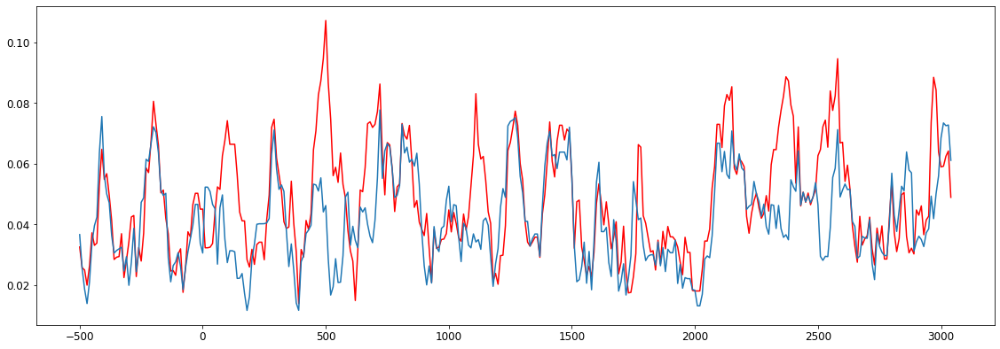

In [123]:
fig = plt.figure(figsize=(15, 5))
ax = fig.add_axes([1,1,1,1])
    
ax.plot(bins_plotting, BCD_roc, 'r')
ax.plot(bins_plotting, WCD_roc)

In [523]:
# Get number of neurons per area
n_neurons = {}
for area in brain_areas:
    datadir = datapathsave + monkey + '\\' + area + '\\good_neurons\\task_responsive\\'
    os.chdir(datadir)
    n_neurons[area] = len([f for f in glob.glob("*.mat")])

currdatapath = figpath + 'rCTI\\' + monkey + '_rCTI.mat'
rCTI_all = sio.loadmat(currdatapath)['rCTI_all']
rCTI_mean = sio.loadmat(currdatapath)['rCTI_mean']
rCTI_std = sio.loadmat(currdatapath)['rCTI_std']

#### Plot rCTI

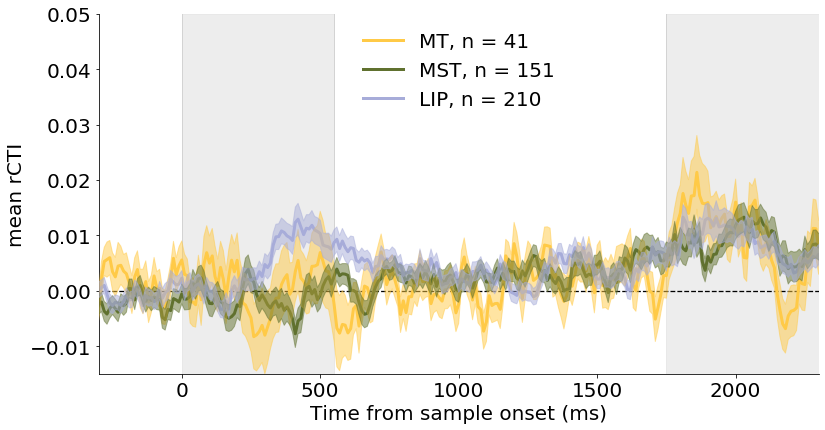

In [524]:
n_timepoints_total = len(data[0][0])
bins_plotting = np.arange(-500, 3050, 10)

fig = plt.figure(figsize=(10, 5))
ax = fig.add_axes([1,1,1,1])

ax.plot([0, 0], [0, 100], 'lightgrey', lw = 1)

for i in range(4):
    ax.plot([TRIAL_EPOCHS[i], TRIAL_EPOCHS[i]], [0, 100], 'lightgrey', lw = 1)

ax.plot([-500, 3000], [0, 0], '--k', lw = 1.3)
plt.ylim([-0.015, 0.05])
plt.xlim([-300, TEST1])

ax.axvspan(0, SAMPLE_STIM, alpha = 0.4, color = 'lightgrey', zorder=1)
ax.axvspan(DELAY1, TEST1, alpha = 0.4, color = 'lightgrey', zorder=2)

for area in brain_areas:
    currmean = np.squeeze(rCTI_mean[area][0][0])
    currstd = np.squeeze(rCTI_std[area][0][0])
    
    ax.plot(bins_plotting, currmean, color = plot_colors[area],  lw = 3, label = "{0}, n = {1}".format(area, n_neurons[area]))
    ax.fill_between(bins_plotting, currmean-currstd, currmean+currstd, color = plot_colors[area],  lw = 1., alpha = 0.5, zorder=20)
    
    
ax.set_xlabel('Time from sample onset (ms)', fontsize = 20)
ax.set_ylabel('mean rCTI', fontsize = 20)
ax.legend(frameon = False, fontsize = 20)

plt.xticks(fontsize=22, rotation=0)
plt.yticks(fontsize=22, rotation=0)

# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.tick_params(labelsize=20)

for i in save_filetype:
    savepath = figpath + 'rCTI\\' + monkey + '_rCTI_sliding_window.' + i
    fig.savefig(savepath, bbox_inches='tight')


### Get proportion cat-tuned and latencies

In [525]:
prop_tuned = {}
latencies_all = {}

bins_rcti = np.arange(-500, 3550-500, 10)
baseline_indx = np.where(bins_rcti < 0)[0]
n_consec = 3

for area in brain_areas:
    
    currpath = datapathsave + monkey + '\\' + area + '\\good_neurons\\task_responsive\\'
    os.chdir(currpath)
    filelist = np.array([f for f in glob.glob("*.mat")])

    make_dirs('category_tuned')

    longest_run = np.zeros(n_neurons[area])
    latencies = np.zeros(n_neurons[area])

    for i_neuron in range(n_neurons[area]):                 
        mean_baseline = np.mean(rCTI_all[area][0][0][i_neuron][baseline_indx])
        std_baseline = np.std(rCTI_all[area][0][0][i_neuron][baseline_indx])

        thresh_above = mean_baseline + std_baseline*4
        thresh_below = mean_baseline - std_baseline*4

        above_thresh_indx = [1 if i > thresh_above else 0 for i in rCTI_all[area][0][0][i_neuron, baseline_indx[-1]:TEST1+500]]
        [run, lat] = max_consecutive_vals(above_thresh_indx, 1, n_consec)

        longest_run[i_neuron] = run

        if lat:
            latencies[i_neuron] = bins_rcti[lat + baseline_indx[-1]] 
        else:
            latencies[i_neuron] = np.nan

    prop_tuned[area] = (len(np.where(longest_run >= n_consec)[0])/n_neurons[area])

    latencies_cleaned = [i for i in latencies if not np.isnan(i)]
    latencies_all[area] = latencies_cleaned
    
    sig_indx = np.where(longest_run >= n_consec)[0]

    #for file in filelist[np.where(longest_run >= n_consec)[0]]:
    #    destination_mat = 'category_tuned\\' + file
    #    figfile = currpath + file
    #    shutil.copy(file, destination_mat)    
    

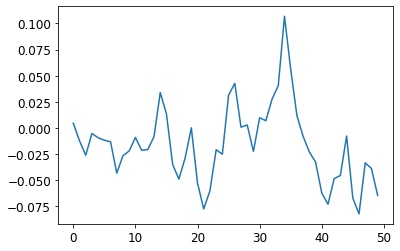

In [507]:
plt.plot(rCTI_all[area][0][0][i_neuron][baseline_indx])

In [508]:
longest_run

array([ 18.,   0.,   9.,  43.,  31.,  47.,  33.,  27.,  22.,  26.,  39.,
        11.,  27.,   0.,   8.,   2.,   0.,  11.,   4.,   7.,   0.,   6.,
         0.,   2.,   7.,   3.,   3.,  66.,  14.,  31.,   8.,   0.,  38.,
        35.,   7.,  11.,   5.,   0.,   0.,   0.,   5.,   0.,   7.,   0.,
         0.,   7.,   0.,  54.,  38.,  23.,  20.,  23.,  13.,   0.,   6.,
         0.,  22.,   0.,   4.,   0.,   3.,   0.,   0.,  15.,   4.,   0.,
        12.,   0.,   0.,   0.,   0.,   0.,  30.,   2.,  13.,   4.,   0.,
         2.,   6.,   4.,   0.,   0.,   0.,   3.,   6.,  51.,  39.,  51.,
        13.,   5.,   4., 104.,  12.,  55.,   0.,   5.,  19.,  24.,  10.,
         8.,  10.,  14.,  20.,   0.,  12.,   9.,  67.,  13.,  36.,   0.,
         0.,   0.,   2.,   0.,   0.,   4.,  11.,   0.,   0.,  22.,   0.,
         0.,   2.,   8.,   9.,   8.,   0.,  43.,   8.,  46.,  46.,  21.,
        46.,  64.,   0.,  11.,  16.,  40.,   0.,  23.,  23.,   0.,   6.,
         9.,   0.,   0.,   7.,   8.,   0.,   0.,   

In [509]:
latencies

array([ 140.,   nan,  360.,  240.,  270.,  230.,  650., 1570., 1870.,
        220.,   50., 2140., 1660.,   nan, 1850.,   nan,   nan, 1950.,
       2150.,  310.,   nan, 1010.,   nan,   nan, 1220., 1870., 1680.,
        150., 1840.,  500., 2550.,   nan,  740.,   80.,   90.,  360.,
        200.,   nan,   nan,   nan, 1700.,   nan, 1760.,   nan,   nan,
       2280.,   nan, 1360.,  430., 1870.,  560., 1930.,  490.,   nan,
        280.,   nan,  460.,   nan, 2320.,   nan, 2410.,   nan,   nan,
        800., 2130.,   nan, 2080.,   nan,   nan,   nan,   nan,   nan,
        510.,   nan, 1890.,  700.,   nan,   nan,  250., 1660.,   nan,
         nan,   nan, 1510., 1340.,  230.,  390.,   90.,  180., 1540.,
       2920., 1320., 1850.,  170.,   nan, 2620., 1780.,  530., 1780.,
       1560., 1870.,  290., 1750.,   nan, 1550., 2020.,  160., 1630.,
        880.,   nan,   nan,   nan,   nan,   nan,   nan, 1880.,  890.,
         nan,   nan,  740.,   nan,   nan,   nan, 2180.,  600.,  730.,
         nan,  630.,

#### Plot proportion category-tuned

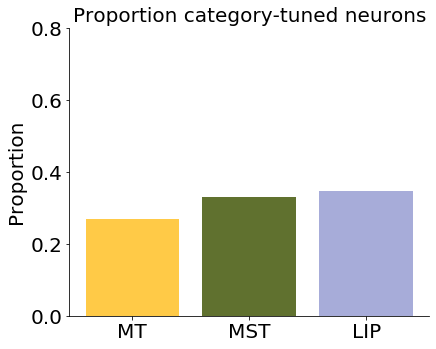

In [526]:
fig = plt.figure(figsize=(5, 4))
ax = fig.add_axes([1,1,1,1])

ax.bar(brain_areas, [prop_tuned['MT'], prop_tuned['MST'], prop_tuned['LIP']], color = [plot_colors['MT'], plot_colors['MST'], plot_colors['LIP']])
#ax.bar(brain_areas, [prop_tuned['MST'], prop_tuned['LIP']], color = [plot_colors['MST'], plot_colors['LIP']])
ax.set_ylabel('Proportion', fontsize = 20)

ax.set_title('Proportion category-tuned neurons', fontsize = 20)
plt.ylim(0, 0.8)

plt.xticks(fontsize=22, rotation=0)
plt.yticks(fontsize=22, rotation=0)

# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.tick_params(labelsize=20)

plt.show()

for i in save_filetype:
    savepath = figpath + 'rCTI\\' + monkey + '_rCTI_prop_tuned.' + i
    fig.savefig(savepath, bbox_inches='tight')

#### Calculate and plot ECDF of latency

In [527]:
x_vals = [[] for i in range(3)]
y_vals = [[] for i in range(3)]

latencies_array = [[] for i in range(3)]

for i, area in enumerate(brain_areas):
    [x, y] = ecdf(latencies_all[area])
    x_vals[i] = x
    y_vals[i] = y
    
    latencies_array[i] = np.array(latencies_all[area])

In [528]:
'''
nSig_sample = np.zeros(3)
nSig_delay = np.zeros(3)
nSig_test = np.zeros(3)

for i in range(3):
    nSig_sample[i] = len(np.intersect1d(np.where(latencies_array[i] >= 0)[0], np.where(latencies_array[i] <= sample)[0]))
    nSig_delay[i] = len(np.intersect1d(np.where(latencies_array[i] >= sample)[0], np.where(latencies_array[i] <= delay1)[0]))
    nSig_test[i] = len(np.intersect1d(np.where(latencies_array[i] >= delay1)[0], np.where(latencies_array[i] <= test1)[0]))
'''

'\nnSig_sample = np.zeros(3)\nnSig_delay = np.zeros(3)\nnSig_test = np.zeros(3)\n\nfor i in range(3):\n    nSig_sample[i] = len(np.intersect1d(np.where(latencies_array[i] >= 0)[0], np.where(latencies_array[i] <= sample)[0]))\n    nSig_delay[i] = len(np.intersect1d(np.where(latencies_array[i] >= sample)[0], np.where(latencies_array[i] <= delay1)[0]))\n    nSig_test[i] = len(np.intersect1d(np.where(latencies_array[i] >= delay1)[0], np.where(latencies_array[i] <= test1)[0]))\n'

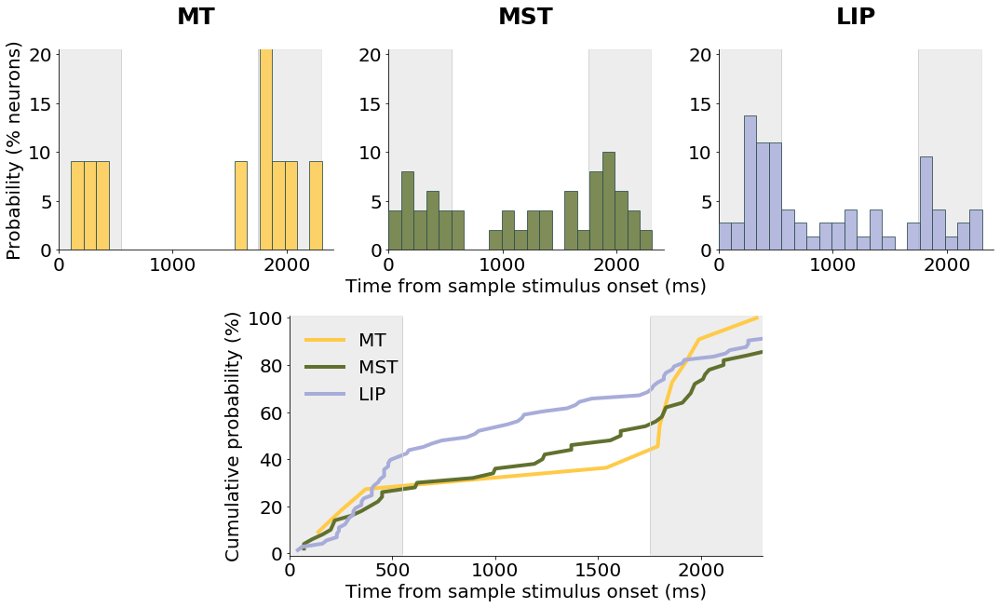

In [529]:
 ### Plot correlations
fig = plt.figure()
ax = fig.subplots(2, 6)
plt.close()
fig = plt.figure(constrained_layout=False, figsize=(18, 10))
widths = [4, 1, 4, 1, 1, 4]
heights = [1, 1.2]
gs = fig.add_gridspec(ncols = 6, nrows = 2, width_ratios = widths, height_ratios = heights, wspace = 0.5, hspace = 0.3)

ax[0, 0] = fig.add_subplot(gs[0, 0:2])
ax[0, 1]  = fig.add_subplot(gs[0, 2:4])
ax[0, 2]  = fig.add_subplot(gs[0, 4:])
ax[1, 0]  = fig.add_subplot(gs[1:, 1:5])

for i, area in enumerate(brain_areas):
    [hists, edges] = np.histogram(latencies_all[area], bins = np.arange(0, TEST1+110, 110))
    ax[0, i].bar(edges[:-1], hists/(prop_tuned[area]*n_neurons[area])*100, 110, edgecolor = 'darkslategrey', alpha = 0.8, facecolor = plot_colors[area], label = area, align = 'edge', zorder = 20)  
    #ax[i].hist(latencies_all[area], bins = np.arange(0, 3000, 175), edgecolor = 'darkslategrey', alpha = 0.8, density = True, facecolor = plot_colors[area], label = area)
    ax[0, i].set_title(brain_areas[i], fontsize = 25, y = 1.1, fontweight = 'bold')
    
    for ii in range(2):
        ax[0, i].plot([TRIAL_EPOCHS[ii], TRIAL_EPOCHS[ii]], [0, 100], 'lightgrey', lw = 1)
        
    ax[0, i].axvspan(0, TRIAL_EPOCHS[0], alpha = 0.4, color = 'lightgrey', zorder=1)
    ax[0, i].axvspan(TRIAL_EPOCHS[1], TRIAL_EPOCHS[2], alpha = 0.4, color = 'lightgrey', zorder=2)


    ax[0, i].set_xlim(0, TEST1+110)
    ax[0, i].tick_params(labelsize=20)
    ax[0, i].set_ylim(0, 20.5)
    
    ax[0, i].set_yticks(np.arange(0, 21, 5))
    #ax[0, i].set(yticklabels = ytick_dirs)
    

ax[0, 0].set_ylabel('Probability (% neurons)', fontsize = 20)
ax[0, 1].set_xlabel('Time from sample stimulus onset (ms)', fontsize = 20)

# Hide the right and top spines
for i in range(3):
    ax[0, i].spines['right'].set_visible(False)
    ax[0, i].spines['top'].set_visible(False)

for i, area in enumerate(brain_areas):
    ax[1, 0].plot(x_vals[i], y_vals[i]*100, color = plot_colors[area], lw = 4, label = area)
    
ax[1, 0].plot([0, 0], [0, 100], 'lightgrey', lw = 1)
for i in range(4):
    ax[1, 0].plot([TRIAL_EPOCHS[i], TRIAL_EPOCHS[i]], [0, 100], 'lightgrey', lw = 1)
    
ax[1, 0].axvspan(0, TRIAL_EPOCHS[0], alpha = 0.4, color = 'lightgrey', zorder=1)
ax[1, 0].axvspan(TRIAL_EPOCHS[1], TRIAL_EPOCHS[2], alpha = 0.4, color = 'lightgrey', zorder=2)

ax[1, 0].set_ylabel('Cumulative probability (%)', fontsize = 20)
ax[1, 0].set_xlabel('Time from sample stimulus onset (ms)', fontsize = 20)
plt.ylim(-1, 101)
plt.xlim(0, TEST1)


plt.xticks(fontsize=22, rotation=0)
plt.yticks(fontsize=22, rotation=0)

# Hide the right and top spines
ax[1, 0].spines['right'].set_visible(False)
ax[1, 0].spines['top'].set_visible(False)

plt.tick_params(labelsize=20)

ax[1, 0].legend(frameon = False, fontsize = 20)

plt.show()
for i in save_filetype:
    savepath = figpath + 'rCTI\\' + monkey + '_rCTI_latency.' + i
    #fig.savefig(savepath, bbox_inches='tight')

### rCTI category-tuned only

In [419]:
rCTI_sliding_window_all = {}
rCTI_mean = {}
rCTI_std = {}

for area in brain_areas: 
    dirs = np.array(dirs)

    currpath = datapathsave + monkey + '\\' + area + '\\good_neurons\\task_responsive\\category_tuned\\'

    os.chdir(currpath)
    filelist = [f for f in glob.glob("*.mat")]
    n_files = len(filelist)

    rCTI_all = [[] for i in range(n_files)]

    for i, file in enumerate(filelist):
        data = sio.loadmat(file)['binned_spikes'][0]
        bins = sio.loadmat(file)['bins_raw'][0][0:-1]      
        
        psth_by_dir = [[] for i in range(12)]
        for ii, val in enumerate(np.arange(0, 72, 6)):
            psth_by_dir[ii] = np.vstack([iii for iii in data[val:val+6] if len(iii)> 0])

        [WCD_roc_all, WCD_roc] = get_WC_BC_ROC(psth_by_dir, WCD_pairs_indx, step_size)
        [BCD_roc_all, BCD_roc] = get_WC_BC_ROC(psth_by_dir, BCD_pairs_indx, step_size)
    
        rCTI_all[i] = BCD_roc-WCD_roc
    
    rCTI_sliding_window_all[area] = np.squeeze(rCTI_all)
    rCTI_mean[area] = np.mean(rCTI_all, 0)
    rCTI_std[area] = sp.stats.sem(rCTI_all, 0)
    
savepath = figpath + 'rCTI\\' + monkey + '_rCTI_category_tuned.mat'
sp.io.savemat(savepath,  {'rCTI_all': rCTI_sliding_window_all, 'rCTI_mean': rCTI_mean, 'rCTI_std': rCTI_std})
    

NameError: name 'dirs' is not defined

In [20]:
currdatapath = figpath + 'rCTI\\' + monkey + '_rCTI_category_tuned.mat'
rCTI_all_cat = sio.loadmat(currdatapath)['rCTI_all']
rCTI_mean_cat = sio.loadmat(currdatapath)['rCTI_mean']
rCTI_std_cat = sio.loadmat(currdatapath)['rCTI_std']

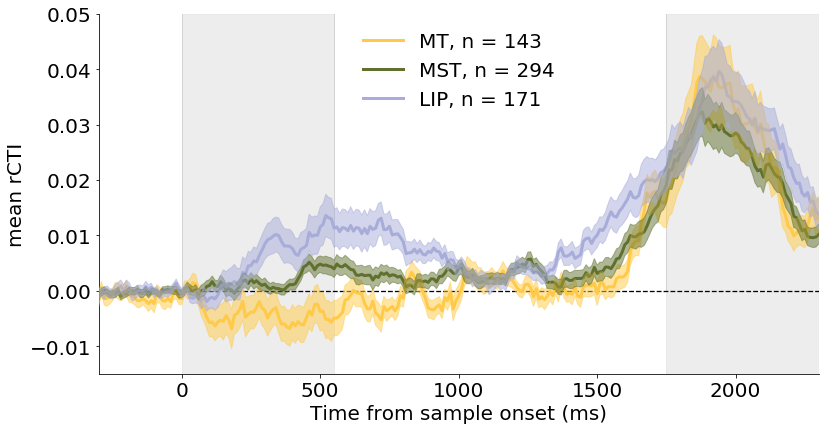

In [21]:
n_timepoints_total = len(data[0][0])
bins_plotting = np.arange(-500, 3050, 10)

fig = plt.figure(figsize=(10, 5))
ax = fig.add_axes([1,1,1,1])

ax.plot([0, 0], [0, 100], 'lightgrey', lw = 1)

for i in range(4):
    ax.plot([trial_epochs[i], trial_epochs[i]], [0, 100], 'lightgrey', lw = 1)

ax.plot([-500, 3000], [0, 0], '--k', lw = 1.3)
plt.ylim([-0.015, 0.05])
plt.xlim([-300, test1])

ax.axvspan(0, sample, alpha = 0.4, color = 'lightgrey', zorder=1)
ax.axvspan(delay1, test1, alpha = 0.4, color = 'lightgrey', zorder=2)

for area in brain_areas:
    
    currmean = np.squeeze(rCTI_mean_cat[area][0][0])
    currstd = np.squeeze(rCTI_std_cat[area][0][0])
    
    ax.plot(bins_plotting, currmean, color = plot_colors[area],  lw = 3, label = "{0}, n = {1}".format(area, n_neurons[area]))
    ax.fill_between(bins_plotting, currmean-currstd, currmean+currstd, color = plot_colors[area],  lw = 1., alpha = 0.5, zorder=20)
    
    
ax.set_xlabel('Time from sample onset (ms)', fontsize = 20)
ax.set_ylabel('mean rCTI', fontsize = 20)
ax.legend(frameon = False, fontsize = 20)

plt.xticks(fontsize=22, rotation=0)
plt.yticks(fontsize=22, rotation=0)

# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.tick_params(labelsize=20)

for i in save_filetype:
    savepath = figpath + 'rCTI\\' + monkey + '_rCTI_sliding_window_cat_tuned.' + i
    fig.savefig(savepath, bbox_inches='tight')


## rCTI per epoch

In [ ]:
area = 'LIP'

dirs = np.array(dirs)

currpath = datapath + area + '\\good_neurons\\task_responsive\\'
currfigpath = figpath + 'psth\\' + area + '\\good_neurons\\'

os.chdir(currpath)
filelist = [f for f in glob.glob("*.mat")]
n_files = len(filelist)

#rCTI_all = [[] for i in range(n_files)]

for file in filelist:
    data = sio.loadmat(file)
    data = data['raw_spikes']
    data = np.array(np.squeeze(all_spikes))


    [WCD_roc_all, WCD_roc] = get_WC_BC_ROC(data, WCD_pairs_indx)
    [BCD_roc_all, BCD_roc] = get_WC_BC_ROC(data, BCD_pairs_indx)

    rCTI_all[i] = BCD_roc-WCD_roc
    
rCTI_mean = np.mean(rCTI_all, 0)
rCTI_sem = sp.stats.sem(rCTI_all, 0)

savepath = figpath + 'rCTI\\' + area + '_rCTI.mat'
sp.io.savemat(savepath,  {'rCTI_all': rCTI_all, 'rCTI_mean': rCTI_mean, 'rCTI_sem': rCTI_sem}) 


In [ ]:
def get_WC_BC_ROC_epoch(data, pairs_indx, trial_epochs):
    
    indx_baseline = epoch_inds(bins, -500, 0)
    indx_samp = epoch_inds(bins, 0, trial_epochs[0])
    indx_delay1 = epoch_inds(bins, trial_epochs[0], trial_epochs[1]-600)
    indx_delay2 = epoch_inds(bins, trial_epochs[1]-600, trial_epochs[1])
    indx_test1 = epoch_inds(bins, trial_epochs[1], trial_epochs[2])

    n_pairs = len(pairs_indx)
           
    [mean_baseline, all_baseline] = get_epoch_means(data, indx_baseline)
    [mean_samp, all_samp] = get_epoch_means(data, indx_samp)
    [mean_delay1, all_delay1] = get_epoch_means(data, indx_delay1)
    [mean_delay2, all_delay2] = get_epoch_means(data, indx_delay2)
    [mean_test1, all_test1] = get_epoch_means(data, indx_test1)    


    roc_all = np.zeros([n_pairs, n_timepoints])

    for i_pair in range(n_pairs):
        dir1 = data[pairs_indx[i_pair][0]]
        dir2 = data[pairs_indx[i_pair][1]]

        for i_timepoint in range(n_timepoints):
            y_true = np.hstack([np.zeros(np.size(dir1, 0)), np.ones(np.size(dir2, 0))])
            y_data = np.hstack([dir1[:, i_timepoint], dir2[:, i_timepoint]])    

            curr_roc = abs(roc_auc_score(y_true, y_data) - 0.5)
            roc_all[i_pair, i_timepoint] = curr_roc
            
    mean_roc = np.mean(roc_all, 0)

    return roc_all, mean_roc
        

# Boundary vs center bias

In [528]:
dirs = [247.5, 225, 202.5, 67.5, 45, 22.5, 157.5, 135, 112.5, 337.5, 315, 292.5]

center_dirs = [i for i, val in enumerate(dirs) if isinstance(val, int)]
vert_dirs = [3, 8, 6, 9]
horz_dirs = [0, 5, 2, 11]

In [799]:
area = 'MST'

dirs = np.array(dirs)

currpath = datapath + area + '\\good_neurons\\by_dir\\task_responsive\\'
#currfigpath = figpath + 'psth\\' + area + '\\good_neurons\\'

sigs = [0, 0, 0]

os.chdir(currpath)
filelist = [f for f in glob.glob("*.mat")]
n_files = len(filelist)

all_center = []
all_vert = []
all_horz = []

for file in filelist:
    data = sio.loadmat(file)
    spikes = data['binned_spikes']
    spikes = np.array(np.squeeze(spikes))
    
    bins = data['bins_raw']
    indx = np.intersect1d(np.where(bins > 80)[1], np.where(bins < 280)[1])

    center = np.vstack(spikes[center_dirs])
    vert = np.vstack(spikes[vert_dirs])
    horz = np.vstack(spikes[horz_dirs])
    
    center_mean = np.mean(center[:, indx], 1)
    vert_mean = np.mean(vert[:, indx], 1)    
    horz_mean = np.mean(horz[:, indx], 1)

    [f, pval] = stats.f_oneway(center_mean, vert_mean, horz_mean)
    
    if pval <= 0.05:
        sigindx = np.argmax([np.mean(center_mean), np.mean(vert_mean), np.mean(horz_mean)])
        sigs[sigindx] += 1
        #print(file)
    
    all_center.append(np.mean(center_mean))
    all_vert.append(np.mean(vert_mean))
    all_horz.append(np.mean(horz_mean))
    


In [800]:
sigs

[6, 17, 12]

(array([ 7., 24., 56., 62., 55., 31., 10.,  9.,  3.,  2.]),
 array([ 0.44221106,  1.73115578,  3.0201005 ,  4.30904523,  5.59798995,
         6.88693467,  8.1758794 ,  9.46482412, 10.75376884, 12.04271357,
        13.33165829]),
 <a list of 10 Patch objects>)

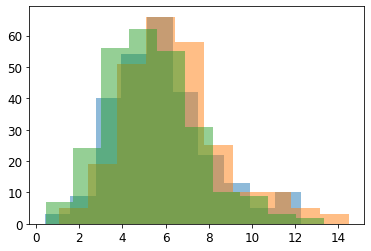

In [568]:
plt.hist(center_mean, alpha = 0.5)
plt.hist(vert_mean, alpha = 0.5)
plt.hist(horz_mean, alpha = 0.5)

In [555]:
sum(sigs)/n_files*100

10.429447852760736

# Early vs late sample selectivity

In [789]:
area = 'MT'
indx = np.intersect1d(np.where(bins > 80)[1], np.where(bins < 280)[1])
indx2 = np.intersect1d(np.where(bins > 380)[1], np.where(bins < 530)[1])

#dirs = np.array(dirs)

currpath = datapath + area + '\\good_neurons\\by_dir\\task_responsive\\'
#currfigpath = figpath + 'psth\\' + area + '\\good_neurons\\'

sigs = [0, 0, 0]

os.chdir(currpath)
filelist = [f for f in glob.glob("*.mat")]
n_files = len(filelist)

all_center = []
all_vert = []
all_horz = []
for file in filelist[0:2]:
    data = sio.loadmat(file)
    spikes = data['mean_psth_raw']
    spikes = np.array(np.squeeze(spikes))
    
    early_tuning = np.mean(spikes[:, indx], 1)
    late_tuning =  np.mean(spikes[:, indx2], 1)
    
    ord_ind = np.argsort(dirs)
    early_tuning = [early_tuning[i] for i in ord_ind]
    late_tuning = [late_tuning[i] for i in ord_ind]
    ord_dirs = [dirs[i] for i in ord_ind]
    
    ord_center = [1, 4, 7, 10]
    order_vert = [0, 11, 5, 6]
    order_horz = [2, 3, 8, 9]

    early_tuning_norm = (early_tuning- min(early_tuning))/(max(early_tuning) - min(early_tuning))
    late_tuning_norm = (late_tuning- min(late_tuning))/(max(late_tuning) - min(late_tuning))
    
    

In [790]:
file

'20191004_1_SPK03a.mat'

[[<matplotlib.lines.Line2D at 0x1934abb9a20>],

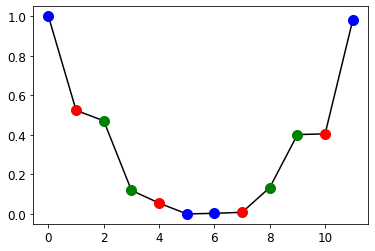

In [791]:
plt.plot(early_tuning_norm, 'k')
[plt.plot(i, v, '.b', MarkerSize = 20) for i, v in enumerate(early_tuning_norm) if i in order_vert]
[plt.plot(i, v, '.r', MarkerSize = 20) for i, v in enumerate(early_tuning_norm) if i in ord_center]
[plt.plot(i, v, '.g', MarkerSize = 20) for i, v in enumerate(early_tuning_norm) if i in order_horz]


[[<matplotlib.lines.Line2D at 0x1934ac34908>],

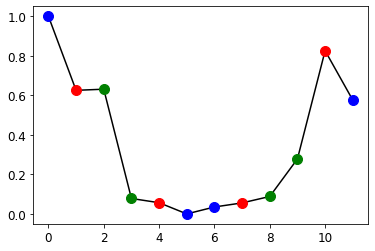

In [792]:
plt.plot(late_tuning_norm, 'k')
[plt.plot(i, v, '.b', MarkerSize = 20) for i, v in enumerate(late_tuning_norm) if i in order_vert]
[plt.plot(i, v, '.r', MarkerSize = 20) for i, v in enumerate(late_tuning_norm) if i in ord_center]
[plt.plot(i, v, '.g', MarkerSize = 20) for i, v in enumerate(late_tuning_norm) if i in order_horz]

#plt.plot(late_tuning_norm, 'grey')

# Decoder analysis

### Setup

In [ ]:
cat_svm_perf = {}
dir_svm_perf = {}

window = windows[0]
window_name = 'window_' + str(window[0]) + '_' + str(window[-1])
timepoints = np.arange(0, len(window))

for area in brain_areas:
    if exclude_stim1:  
        currpath = datapathsave + monkey + '\\' + area + '\\stim1_excluded\\' + window_name + '\\'
    else:
        currpath = datapathsave + monkey + '\\' + area + '\\stim1_included\\' + window_name + '\\'

    os.chdir(currpath)
    filelist = [f for f in glob.glob("*.mat")]  
    
    n_neurons_decoder = len(filelist)

    spikes_all = {}
    spikes_all['PV'], spikes_all['DMC'] = [], []
    cat_perf_all = {}
    dir_perf_all = {}

    for file in filelist:
        data = sio.loadmat(file)
        spikes_all['PV'].append(data['spikes_binned_pv'].flatten())
        spikes_all['DMC'].append(data['spikes_binned_dmc'].flatten())
        
    for task in tasks:
        cat_perf_all[task] = category_decoder(spikes_all[task], n_iter_sw, timepoints, n_neurons_decoder, n_neurons_decoder, n_trials_cat)    
        dir_perf_all[task] = direction_decoder(spikes_all[task], n_iter_sw, timepoints, n_neurons_decoder, n_neurons_decoder, n_trials_dir)    
    
    cat_svm_perf[area] = cat_perf_all
    dir_svm_perf[area] = dir_perf_all

'20200630_2_SPK01a'

In [74]:
monkey

'Stanton'

In [68]:
monkey = 'Stanton'

### Decoder analysis parameters

In [660]:
# Num iterations
n_iter = 200

# Num trials
n_trials_cat = 20 # per dir, so per cat = 60
n_trials_dir = 12 # per dir

# Equal number of neurons per area
count_matched = True

In [661]:
brain_areas

['MT', 'MST', 'LIP']

In [662]:
# Get number of neurons per area
n_neurons = {}
for area in brain_areas:
    datadir = datapathsave + monkey + '\\' + area + '\\good_neurons\\task_responsive\\'
    os.chdir(datadir)
    n_neurons[area] = len([f for f in glob.glob("*.mat")])

### Category decoder

In [663]:
n_neurons

{'MT': 96, 'MST': 151, 'LIP': 210}

In [80]:
savepath_dir

'E:\\two_boundary\\figures\\direction_decoding\\Stantondir_decoder_count_unmatched.mat'

In [664]:
cat_decoder_mean_all = {}
dir_decoder_mean_all = {}

for i_area, area in enumerate(brain_areas):                   
    currpath = datapathsave + monkey + '\\' + area + '\\good_neurons\\task_responsive\\'
    os.chdir(currpath)
    filelist = [f for f in glob.glob("*.mat")]
    
    if count_matched:
        n_neurons_decoder = min([n_neurons[area] for area in brain_areas])     
        savepath_cat = figpath + 'category_decoding\\' +  monkey + '_cat_decoder_count_matched.mat'
        savepath_dir = figpath + 'direction_decoding\\' +  monkey + '_dir_decoder_count_matched.mat'
    else:
        n_neurons_decoder = n_neurons[area]    
        savepath_cat = figpath + 'category_decoding\\' +  monkey + '_cat_decoder_count_unmatched.mat'   
        savepath_dir = figpath + 'direction_decoding\\' +  monkey + '_dir_decoder_count_unmatched.mat'
        
    decoder_all, decoder_mean, decoder_std = run_decoder_dmc(area, filelist, bins, n_iter, 'cat', n_trials_cat, n_neurons_decoder, n_neurons[area]) 
    cat_decoder_mean_all[area] = {'decoder_mean': decoder_mean, 'decoder_std': decoder_std, 'decoder_all': decoder_all}
        
    decoder_all, decoder_mean, decoder_std = run_decoder_dmc(area, filelist, bins, n_iter, 'dir', n_trials_dir, n_neurons_decoder, n_neurons[area]) 
    dir_decoder_mean_all[area] = {'decoder_mean': decoder_mean, 'decoder_std': decoder_std, 'decoder_all': decoder_all}
    
sp.io.savemat(savepath_cat, {'cat_decoder_all': cat_decoder_mean_all}) 
sp.io.savemat(savepath_dir, {'dir_decoder_all': dir_decoder_mean_all})    

### Plotting

In [49]:
currdatapath = figpath + 'category_decoding\\' +  monkey + '_cat_decoder_count_matched.mat'
cat_decoder_all = sio.loadmat(currdatapath)['cat_decoder_all'][0][0].flatten()
#cat_decoder_mean_all = sio.loadmat(currdatapath)['perf_std'] 

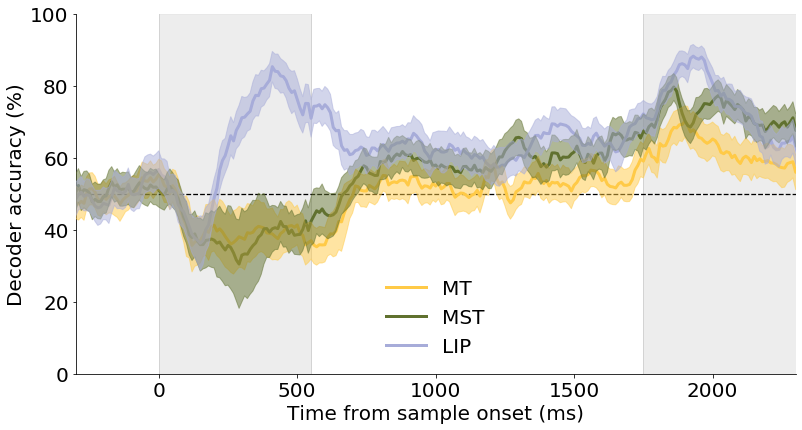

In [50]:
tp_plotting = np.arange(-500, 3050, 10)
       
fig = plt.figure(figsize=(10, 5))
ax = fig.add_axes([1,1,1,1])
        
ax.plot([0, 0], [0, 100], 'lightgrey', lw = 1)
for i in range(4):
    ax.plot([TRIAL_EPOCHS[i], TRIAL_EPOCHS[i]], [0, 100], 'lightgrey', lw = 1)

ax.plot([-400, 3000], [50, 50], '--k', lw = 1.3)
plt.ylim([0, 100])
plt.xlim([-300, TEST1])
#plt.xlim([2800, test2])

ax.axvspan(0, SAMPLE_STIM, alpha = 0.4, color = 'lightgrey', zorder=1)
ax.axvspan(DELAY1, TEST1, alpha = 0.4, color = 'lightgrey', zorder=2)

for area in brain_areas:
    
    currmean = cat_decoder_all[area][0][0]['decoder_mean'][0][0]
    currstd = cat_decoder_all[area][0][0]['decoder_std'][0][0]
    
    ax.plot(tp_plotting, currmean, color = plot_colors[area],  lw = 3, label = area)
    #ax.plot(tp_plotting, currmean, color = plot_colors[area],  lw = 3, label = "{0}, n = {1}".format(area, n_neurons[area]))
    ax.fill_between(tp_plotting, currmean-currstd, currmean+currstd, color = plot_colors[area],  lw = 1., alpha = 0.5, zorder=20)
    
    
ax.set_xlabel('Time from sample onset (ms)', fontsize = 20)
ax.set_ylabel('Decoder accuracy (%)', fontsize = 20)
ax.legend(frameon = False, fontsize = 20)

plt.xticks(fontsize=22, rotation=0)
plt.yticks(fontsize=22, rotation=0)

# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.tick_params(labelsize=20)

for i in save_filetype:
    savepath = figpath + 'category_decoding\\' + monkey + '_cat_decoder_count_matched.' + i
    fig.savefig(savepath, bbox_inches='tight')


## Direction decoding

In [19]:
monkey = 'Stanton'

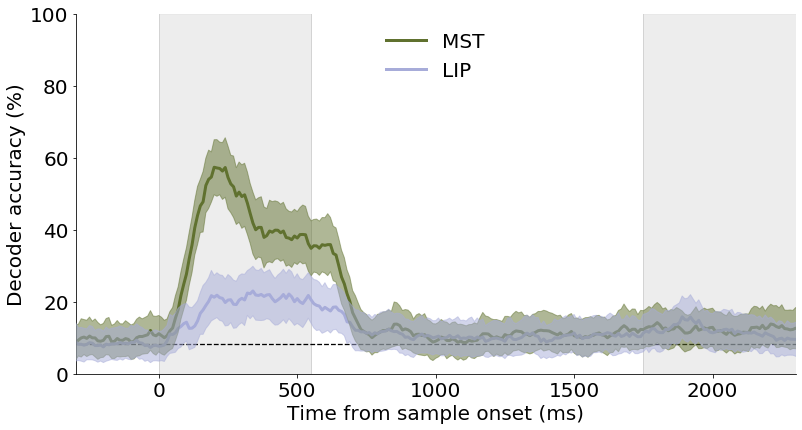

In [52]:
currdatapath = figpath + 'direction_decoding\\' +  monkey + '_dir_decoder_count_matched.mat'
cat_decoder_mean_all = sio.loadmat(currdatapath)['dir_decoder_mean_all'][0][0].flatten()

tp_plotting = np.arange(-500, 3050, 10)
       
fig = plt.figure(figsize=(10, 5))
ax = fig.add_axes([1,1,1,1])
        
ax.plot([0, 0], [0, 100], 'lightgrey', lw = 1)
for i in range(4):
    ax.plot([TRIAL_EPOCHS[i], TRIAL_EPOCHS[i]], [0, 100], 'lightgrey', lw = 1)

ax.plot([-400, 3000], [1/12*100, 1/12*100], '--k', lw = 1.3)
plt.ylim([0, 100])
plt.xlim([-300, TEST1])
#plt.xlim([2800, test2])

ax.axvspan(0, SAMPLE_STIM, alpha = 0.4, color = 'lightgrey', zorder=1)
ax.axvspan(DELAY1, TEST1, alpha = 0.4, color = 'lightgrey', zorder=2)

for area in brain_areas:
    
    currmean = cat_decoder_mean_all[area][0][0]['decoder_mean'][0][0]
    currstd = cat_decoder_mean_all[area][0][0]['decoder_std'][0][0]
    
    ax.plot(tp_plotting, currmean, color = plot_colors[area],  lw = 3, label = area)
    #ax.plot(tp_plotting, currmean, color = plot_colors[area],  lw = 3, label = "{0}, n = {1}".format(area, n_neurons[area]))
    ax.fill_between(tp_plotting, currmean-currstd, currmean+currstd, color = plot_colors[area],  lw = 1., alpha = 0.5, zorder=20)
    
    
ax.set_xlabel('Time from sample onset (ms)', fontsize = 20)
ax.set_ylabel('Decoder accuracy (%)', fontsize = 20)
ax.legend(frameon = False, fontsize = 20)

plt.xticks(fontsize=22, rotation=0)
plt.yticks(fontsize=22, rotation=0)

# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.tick_params(labelsize=20)

for i in save_filetype:
    savepath = figpath + 'direction_decoding\\' + monkey + '_dir_decoder_count_matched.' + i
    #fig.savefig(savepath, bbox_inches='tight')


In [72]:
currdatapath = figpath + 'direction_decoding\\' +  monkey + '_dir_decoder_count_matched.mat'
perf_mean_dir = sio.loadmat(currdatapath)['perf_mean']
perf_std_dir = sio.loadmat(currdatapath)['perf_std']

### Plotting

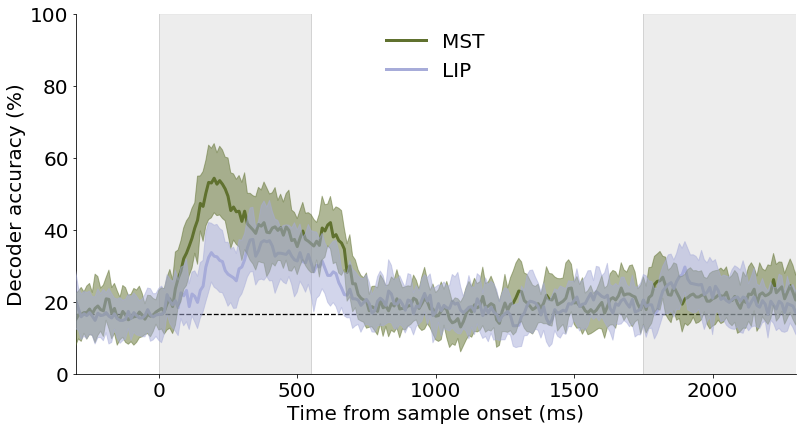

In [73]:
tp_plotting = np.arange(-500, 3050, 10)
       
fig = plt.figure(figsize=(10, 5))
ax = fig.add_axes([1,1,1,1])
        
ax.plot([0, 0], [0, 100], 'lightgrey', lw = 1)
for i in range(4):
    ax.plot([trial_epochs[i], trial_epochs[i]], [0, 100], 'lightgrey', lw = 1)

ax.plot([-400, 3000], [1/6*100, 1/6*100], '--k', lw = 1.3)
plt.ylim([0, 100])
plt.xlim([-300, test1])
#plt.xlim([2800, test2])

ax.axvspan(0, sample, alpha = 0.4, color = 'lightgrey', zorder=1)
ax.axvspan(delay1, test1, alpha = 0.4, color = 'lightgrey', zorder=2)

for area in brain_areas:
    
    currmean = np.squeeze(perf_mean_dir[area][0][0])
    currstd = np.squeeze(perf_std_dir[area][0][0])
    
    ax.plot(tp_plotting, currmean, color = plot_colors[area],  lw = 3, label = area)
    #ax.plot(tp_plotting, currmean, color = plot_colors[area],  lw = 3, label = "{0}, n = {1}".format(area, n_neurons[area]))
    ax.fill_between(tp_plotting, currmean-currstd, currmean+currstd, color = plot_colors[area],  lw = 1., alpha = 0.5, zorder=20)
    
    
ax.set_xlabel('Time from sample onset (ms)', fontsize = 20)
ax.set_ylabel('Decoder accuracy (%)', fontsize = 20)
ax.legend(frameon = False, fontsize = 20)

plt.xticks(fontsize=22, rotation=0)
plt.yticks(fontsize=22, rotation=0)

# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.tick_params(labelsize=20)

for i in save_filetype:
    savepath = figpath + 'direction_decoding\\' + monkey + '_dir_decoder_unmatched_count.' + i
    fig.savefig(savepath, bbox_inches='tight')


In [65]:
tp_plotting = np.arange(-500, 3050, 10)
       
fig, ax =  plt.subplots(1, 3, figsize=(20, 4.5))

for i in range(3):
    ax[i].plot([0, 0], [0, 100], 'lightgrey', lw = 1)
    for ii in range(4):
        ax[i].plot([trial_epochs[ii], trial_epochs[ii]], [0, 100], 'lightgrey', lw = 1)
    ax[i].plot([-400, 3000], [1/6*100, 1/6*100], '--k', lw = 1.3)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].axvspan(0, sample, alpha = 0.4, color = 'lightgrey', zorder=1)
    ax[i].axvspan(delay1, test1, alpha = 0.4, color = 'lightgrey', zorder=2)
    ax[i].set_ylim(10, 60)
    ax[i].set_xlim(-300, test1)
    ax[i].set_title(brain_areas[i], fontsize = 20)
    
ax[0].plot(tp_plotting, perf_cat_MT, color = color_MT, linestyle = '--', lw = 2.5)
ax[0].plot(tp_plotting, perf_cat_MT_all, color = color_MT, lw = 2.5)
ax[0].set_ylabel('Performance (%)', fontsize = 20)

ax[1].plot(tp_plotting, perf_cat_MST, color = color_MST, linestyle = '--', lw = 2.5)
ax[1].plot(tp_plotting, perf_cat_MST_all, color = color_MST, lw = 2.5, zorder = 10)
ax[1].plot(tp_plotting, perf_cat_MST, color = 'k', linestyle = '--', lw = 2.5, label = 'Only category-tuned neurons', zorder=1)
ax[1].plot(tp_plotting, perf_cat_MST_all, color = 'k', lw = 2.5, label = 'All neurons', zorder=1)
ax[1].set_xlabel('Time from sample onset (ms)', fontsize = 20)
ax[1].legend(frameon = False, fontsize = 15)

ax[2].plot(tp_plotting, perf_cat_LIP, color = color_LIP, linestyle = '--', lw = 2.5)
ax[2].plot(tp_plotting, perf_cat_LIP_all, color = color_LIP, lw = 2.5)

#savepath = figpath + 'direction_decoding\\dir_decoder_cat_tuned_comparison.png'
#fig.savefig(savepath, bbox_inches='tight')


# PCA

In [86]:
monkey = 'Neville'

In [200]:
timepoints = np.arange(np.where(bins == -100)[0][0], np.where(bins == SAMPLE_STIM)[0][0])

for area in brain_areas[2:]:
    
    if monkey != 'both':
        currpath = datapathsave + monkey + '\\' + area + '\\good_neurons\\task_responsive\\'
        os.chdir(currpath)
        filelist = [f for f in glob.glob("*.mat")]

    else:
        currpath1 = datapathsave + 'Neville' + '\\' + area + '\\good_neurons\\task_responsive\\'   
        currpath2 = datapathsave + 'Stanton' + '\\' + area + '\\good_neurons\\task_responsive\\'
      
        os.chdir(currpath1)
        filelist1 = [os.path.abspath(f) for f in glob.glob("*.mat")]  
        os.chdir(currpath2)
        filelist2 = [os.path.abspath(f) for f in glob.glob("*.mat")]  
        
        filelist = np.hstack([filelist1, filelist2])
        
    spikes_all = []

    for file in filelist:
        data = sio.loadmat(file)
        data_by_cond = data['binned_spikes'].flatten()*10
        data_by_dir = org_data_by_dir(data_by_cond)
        stacked = np.hstack([gaussian_filter1d(np.mean(i[:, timepoints], 0), 30) for i in data_by_dir])       
        spikes_all.append(stacked.T)
        
    #for task in tasks:
        #cat_perf_all[task] = category_decoder(spikes_all[task], n_iter_sw, timepoints, n_neurons_decoder, n_neurons_decoder, n_trials_cat)    
        #dir_perf_all[task] = direction_decoder(spikes_all[task], n_iter_sw, timepoints, n_neurons_decoder, n_neurons_decoder, n_trials_dir)    
    


In [201]:
from sklearn.decomposition import PCA

all_stacked = np.array(spikes_all).T    

pca = PCA(n_components = len(filelist))
pca.fit(all_stacked)

projection = pca.transform(all_stacked)

n_timepoints = len(timepoints)

pca_indices = {}

for i_dir in range(N_DIRS):
    startindx = 0+(n_timepoints*i_dir)
    pca_indices[i_dir] = [startindx, startindx+n_timepoints]


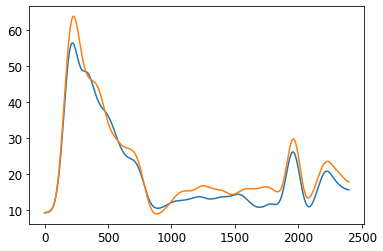

In [160]:
plt.plot(all_stacked[0:2400, 0])
plt.plot(all_stacked[2400:4800, 0])

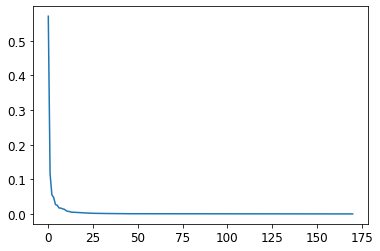

In [202]:
%matplotlib inline
plt.plot(range(0, len(filelist)), pca.explained_variance_ratio_)

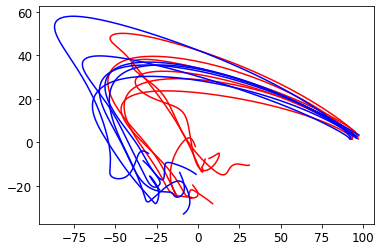

In [203]:
%matplotlib inline

for i_dir in range(6):
    plt.plot(projection[pca_indices[i_dir][0]:pca_indices[i_dir][1], 0], projection[pca_indices[i_dir][0]:pca_indices[i_dir][1], 1], 'r')
    
for i_dir in range(6, 12):
    plt.plot(projection[pca_indices[i_dir][0]:pca_indices[i_dir][1], 0], projection[pca_indices[i_dir][0]:pca_indices[i_dir][1], 1], 'b')



<IPython.core.display.Javascript object>


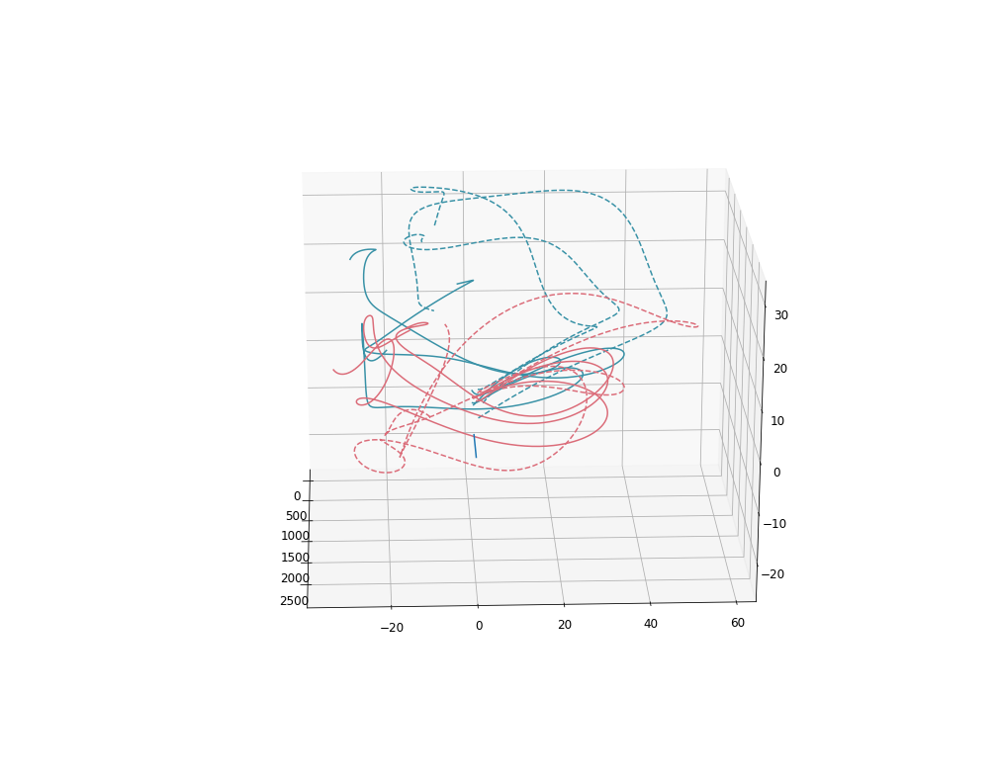

In [207]:
from mpl_toolkits import mplot3d
%matplotlib notebook
fig = plt.figure()
ax = plt.axes(projection='3d')

for i_dir in range(3):
    inds = pca_indices[i_dir]
    ax.plot(projection[inds[0]:inds[1], 0], projection[inds[0]:inds[1], 1], projection[inds[0]:inds[1], 2], '--', color = plot_colors['Category1'])

for i_dir in range(3, 6):
    inds = pca_indices[i_dir]
    ax.plot(projection[inds[0]:inds[1], 0], projection[inds[0]:inds[1], 1], projection[inds[0]:inds[1], 2], plot_colors['Category1'])
        
for i_dir in range(6, 9):
    inds = pca_indices[i_dir]
    ax.plot(projection[inds[0]:inds[1], 0], projection[inds[0]:inds[1], 1], projection[inds[0]:inds[1], 2], '--', color = plot_colors['Category2'])

for i_dir in range(9, 12):
    inds = pca_indices[i_dir]
    ax.plot(projection[inds[0]:inds[1], 0], projection[inds[0]:inds[1], 1], projection[inds[0]:inds[1], 2], plot_colors['Category2'])



<IPython.core.display.Javascript object>


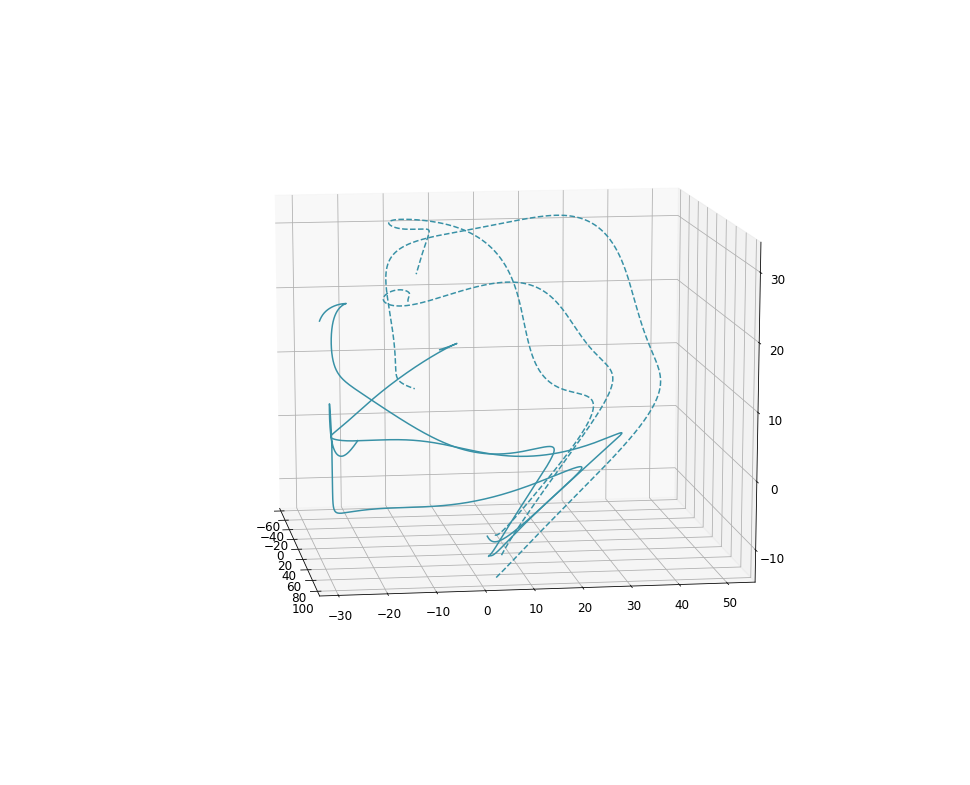

In [205]:
from mpl_toolkits import mplot3d
%matplotlib notebook
fig = plt.figure()
ax = plt.axes(projection='3d')

for i_dir in range(3):
    inds = pca_indices[i_dir]
    ax.plot(projection[inds[0]:inds[1], 0], projection[inds[0]:inds[1], 1], projection[inds[0]:inds[1], 2], '--', color = plot_colors['Category1'])

for i_dir in range(3, 6):
    inds = pca_indices[i_dir]
    ax.plot(projection[inds[0]:inds[1], 0], projection[inds[0]:inds[1], 1], projection[inds[0]:inds[1], 2], plot_colors['Category1'])
        

<IPython.core.display.Javascript object>


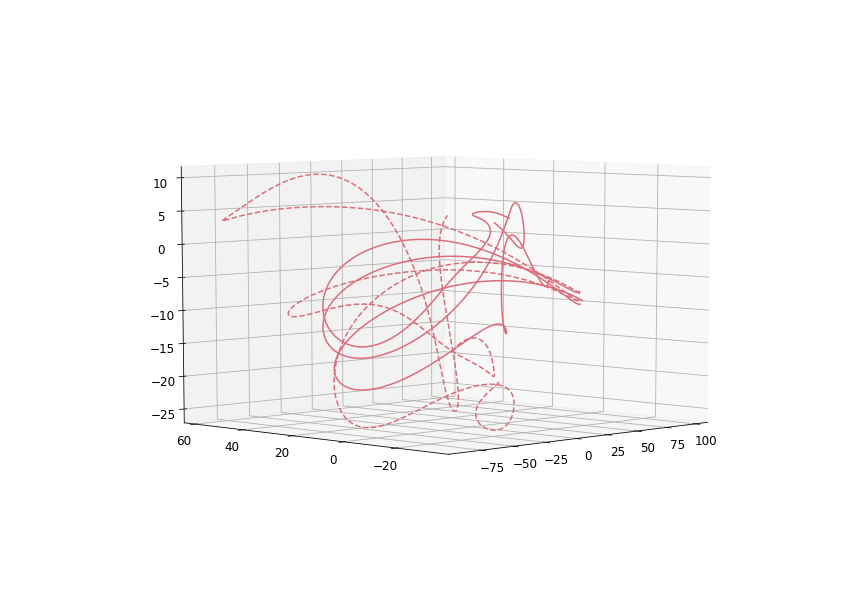

In [206]:
from mpl_toolkits import mplot3d
%matplotlib notebook
fig = plt.figure()
ax = plt.axes(projection='3d')


for i_dir in range(6, 9):
    inds = pca_indices[i_dir]
    ax.plot(projection[inds[0]:inds[1], 0], projection[inds[0]:inds[1], 1], projection[inds[0]:inds[1], 2], '--', color = plot_colors['Category2'])

for i_dir in range(9, 12):
    inds = pca_indices[i_dir]
    ax.plot(projection[inds[0]:inds[1], 0], projection[inds[0]:inds[1], 1], projection[inds[0]:inds[1], 2], plot_colors['Category2'])



In [254]:
tp = np.arange(np.where(bins == DELAY1-100)[0][0], np.where(bins == TEST1)[0][0])

cat1_45 = [2,8,15,20,26,31,40,42,46,48,52,54,58,60,64,66,70,72]
cat1_225 = [1,7,13,20,26,32,39,41,45,47,51,53,57,59,63,65,69,71]
cat2_135 = [3,5,9,11,15,17,22,24,28,30,34,36,37,43,49,56,62,68]
cat2_315 = [4,6,10,12,16,18,21,23,27,29,33,35,38,44,50,55,61,67]


In [319]:
rCTI_sliding_window_all = {}
rCTI_mean = {}
rCTI_std = {}

for area in brain_areas[0:1]: 
    currpath = datapathsave + monkey + '\\' + area + '\\good_neurons\\task_responsive\\'

    os.chdir(currpath)
    filelist = [f for f in glob.glob("*.mat")]
    n_files = len(filelist)

    rCTI_all = [[] for i in range(n_files)]

    for i, file in enumerate(filelist[67:69]):
        data = sio.loadmat(file)['raw_spikes'][0]*1000
        
        cat1_1_sample1 = np.vstack([data[i-1] for i in cat1_45 if len(data[i-1]) > 0 and i <= 36])
        cat1_2_sample1 = np.vstack([data[i-1] for i in cat1_225 if len(data[i-1]) > 0 and i <= 36])
        cat1_1_sample2 = np.vstack([data[i-1] for i in cat1_45 if len(data[i-1]) > 0 and i > 37])
        cat1_2_sample2 = np.vstack([data[i-1] for i in cat1_225 if len(data[i-1]) > 0 and i > 37])
        
        cat2_1_sample2 = np.vstack([data[i-1] for i in cat2_135 if len(data[i-1]) > 0 and i > 37])
        cat2_2_sample2 = np.vstack([data[i-1] for i in cat2_315 if len(data[i-1]) > 0 and i > 37])
        cat2_1_sample1 = np.vstack([data[i-1] for i in cat2_135 if len(data[i-1]) > 0 and i <= 36])
        cat2_2_sample1 = np.vstack([data[i-1] for i in cat2_315 if len(data[i-1]) > 0 and i <= 36])

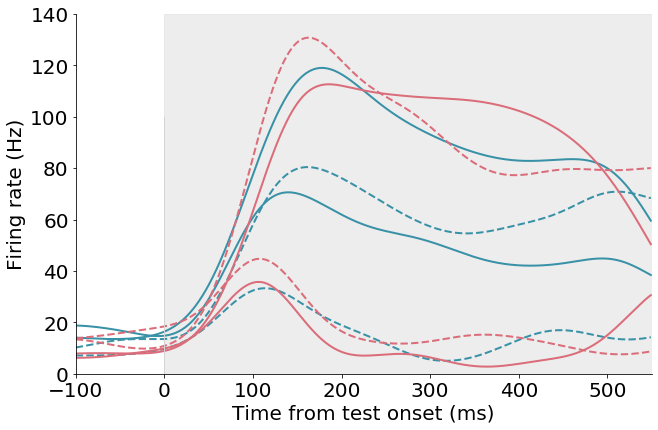

In [325]:
%matplotlib inline
fig = plt.figure(figsize=(8, 5))
ax = fig.add_axes([1,1,1,1])
    
ax.plot(range(-100, len(tp)-100), gaussian_filter1d(np.mean(cat1_1_sample1, 0), sm_std)[tp], color = plot_colors['Category1'], lw = 2)
ax.plot(range(-100, len(tp)-100), gaussian_filter1d(np.mean(cat1_2_sample1, 0), sm_std)[tp], color = plot_colors['Category1'], lw = 2)
ax.plot(range(-100, len(tp)-100), gaussian_filter1d(np.mean(cat1_1_sample2, 0), sm_std)[tp], '--', color = plot_colors['Category1'], lw = 2)
ax.plot(range(-100, len(tp)-100), gaussian_filter1d(np.mean(cat1_2_sample2, 0), sm_std)[tp], '--', color = plot_colors['Category1'], lw = 2)

ax.plot(range(-100, len(tp)-100), gaussian_filter1d(np.mean(cat2_1_sample2, 0), sm_std)[tp], color = plot_colors['Category2'], lw = 2)
ax.plot(range(-100, len(tp)-100), gaussian_filter1d(np.mean(cat2_2_sample2, 0), sm_std)[tp], color = plot_colors['Category2'], lw = 2)
ax.plot(range(-100, len(tp)-100), gaussian_filter1d(np.mean(cat2_1_sample1, 0), sm_std)[tp], '--', color = plot_colors['Category2'], lw = 2)
ax.plot(range(-100, len(tp)-100), gaussian_filter1d(np.mean(cat2_2_sample1, 0), sm_std)[tp], '--', color = plot_colors['Category2'], lw = 2)

ax.plot([0, 0], [0, 100], 'lightgrey', lw = 1)

ax.set_xlabel('Time from test onset (ms)', fontsize = 20)
ax.set_ylabel('Firing rate (Hz)', fontsize = 20)

#ax.axvspan(0, TRIAL_EPOCHS[0], alpha = 0.4, color = 'lightgrey', zorder=1)
ax.axvspan(0, 550, alpha = 0.4, color = 'lightgrey', zorder=2)

plt.xticks(fontsize=22, rotation=0)
plt.yticks(fontsize=22, rotation=0)

plt.xlim((-100, 550))
plt.ylim((0, 140))

# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.tick_params(labelsize=20)


In [65]:
monkey = 'Stanton'

# Noise correlations

In [80]:
epochs = ['sample', 'test']

epoch_inds = {'sample': [np.where(bins >= 100)[0][0], np.where(bins >= SAMPLE_STIM)[0][0]], 
               'test': [np.where(bins >= DELAY1+100)[0][0],np.where(bins >= TEST1)[0][0]]}

In [81]:
noise_correlations = {'sample': {}, 'test': {}}
signal_correlations = {'sample': {}, 'test': {}}

for area in brain_areas[3:]: 
    
    currpath = datapathsave + monkey + '\\' + area + '\\good_neurons\\task_responsive\\'
    os.chdir(currpath)
    filelist = [f for f in glob.glob("*.mat")]
    n_files = len(filelist)

    dates = np.unique([i[0:10] for i in filelist])
    
    for epoch in epochs:
        noise_correlations[epoch][area] = [[] for i in range(len(dates))]
        signal_correlations[epoch][area] = [[] for i in range(len(dates))]
    
    for i_date, date in enumerate(dates):
        curr_files = [f for f in glob.glob(date + '*')]
        
        if len(curr_files) > 2:
            neuron_pairs = list(itertools.combinations(curr_files, 2))
            
            for epoch in epochs:
                noise = [[] for i in range(len(neuron_pairs))]
                sig = np.zeros(len(neuron_pairs))
            
                for i_pair, pair in enumerate(neuron_pairs):

                    file1 = pair[0]
                    file2 = pair[1]

                    data1 = sio.loadmat(file1)['binned_spikes'][0]
                    data_by_dir1 = org_data_by_dir(data1)
                    data2 = sio.loadmat(file2)['binned_spikes'][0]
                    data_by_dir2 = org_data_by_dir(data2)

                    if [len(i) for i in data_by_dir2] == [len(i) for i in data_by_dir1]:

                        neuron1 = ([np.mean(data_by_dir1[i_dir][:, epoch_inds[epoch][0]:epoch_inds[epoch][1]], 1)*10 for i_dir in range(N_DIRS)])
                        neuron2 = ([np.mean(data_by_dir2[i_dir][:, epoch_inds[epoch][0]:epoch_inds[epoch][1]], 1)*10 for i_dir in range(N_DIRS)])

                        tmp1 = list(sp.stats.zscore(np.hstack(neuron1)))
                        tmp2 = list(sp.stats.zscore(np.hstack(neuron2)))

                        neuron1_z = np.zeros_like(neuron1)
                        neuron2_z = np.zeros_like(neuron2)

                        for i_dir in range(N_DIRS):

                            neuron1_z[i_dir] = tmp1[0:len(neuron1[i_dir])]
                            del tmp1[0:len(neuron1[i_dir])]

                            neuron2_z[i_dir] = tmp2[0:len(neuron2[i_dir])]
                            del tmp2[0:len(neuron2[i_dir])]

                        corrs = [stats.pearsonr(neuron1_z[i_dir], neuron2_z[i_dir])[0] for i_dir in range(N_DIRS)]

                        noise[i_pair] = corrs
                        sig[i_pair] = stats.pearsonr([np.mean(neuron1_z[i_dir]) for i_dir in range(N_DIRS)], [np.mean(neuron2_z[i_dir]) for i_dir in range(N_DIRS)])[0]


                    noise_correlations[epoch][area][i_date] = noise
                    signal_correlations[epoch][area][i_date] = sig


In [68]:
sig_sample = [i for i in np.hstack(signal_correlations['sample']['SC']) if i != 0]
sig_test = [i for i in np.hstack(signal_correlations['test']['SC']) if i != 0]

(-1, 1)

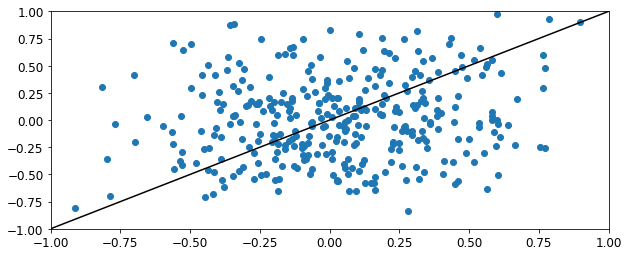

In [69]:
plt.scatter(sig_sample, sig_test)
plt.plot([-1, 1], [-1, 1], 'k')
plt.xlim(-1, 1)
plt.ylim(-1, 1)

In [70]:
noise_sample = []
for i_date in range(len(noise_correlations['sample']['SC'])):
    noise_sample.append([np.nanmean(i) for i in noise_correlations['sample']['SC'][i_date] if len(i) > 0])
noise_sample = np.hstack(noise_sample)

In [71]:
noise_test = []
for i_date in range(len(noise_correlations['test']['SC'])):
    noise_test.append([np.nanmean(i) for i in noise_correlations['test']['SC'][i_date] if len(i) > 0])
noise_test = np.hstack(noise_test)

In [72]:
sum(noise_sample > noise_test)

164

In [73]:
sum(noise_test > noise_sample)

175

(-0.55, 0.8)

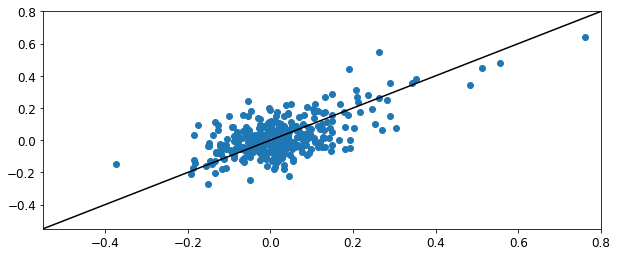

In [74]:
plt.scatter(noise_sample, noise_test)
plt.plot([-1, 1], [-1, 1], 'k')
plt.xlim(-0.55, 0.8)
plt.ylim(-0.55, 0.8)

In [41]:
noise_correlations['sample'][area]

[[[-0.1263469299330296,
   -0.014366939249855583,
   0.026860278443398822,
   -0.19366182859445763,
   0.07796330259144561,
   -0.07289057458916706,
   -0.4333294706345835,
   0.02485057119910799,
   0.45524714060265653,
   -0.14570942950414245,
   -0.1466120747232739,
   0.08972290148156768],
  [-0.08030838310386211,
   -0.09687438615077762,
   -0.10369060750373622,
   0.10142482980089097,
   0.2959591584312543,
   0.1548166418922429,
   -0.15032988168325798,
   -0.17451706620451227,
   0.28436478438610674,
   0.3729238980400053,
   -0.06665758869969073,
   -0.06857311589273267],
  [0.06664014186665262,
   0.14314963504218245,
   -0.054460638881750095,
   -0.005504686438329057,
   -0.20297414339276565,
   0.1401027947996723,
   -0.34402765351566983,
   0.0064588796429347105,
   0.3434349664199098,
   0.07628281982909656,
   0.18990654461350684,
   0.04511132926652671],
  [0.37699340565494005,
   -0.0966440432110093,
   -0.06642068224518075,
   0.03092231239816834,
   0.041386897134156

In [76]:
noise_correlations

{'sample': {'LIP': [[[-0.1263469299330296,
     -0.014366939249855583,
     0.026860278443398822,
     -0.19366182859445763,
     0.07796330259144561,
     -0.07289057458916706,
     -0.4333294706345835,
     0.02485057119910799,
     0.45524714060265653,
     -0.14570942950414245,
     -0.1466120747232739,
     0.08972290148156768],
    [-0.08030838310386211,
     -0.09687438615077762,
     -0.10369060750373622,
     0.10142482980089097,
     0.2959591584312543,
     0.1548166418922429,
     -0.15032988168325798,
     -0.17451706620451227,
     0.28436478438610674,
     0.3729238980400053,
     -0.06665758869969073,
     -0.06857311589273267],
    [0.06664014186665262,
     0.14314963504218245,
     -0.054460638881750095,
     -0.005504686438329057,
     -0.20297414339276565,
     0.1401027947996723,
     -0.34402765351566983,
     0.0064588796429347105,
     0.3434349664199098,
     0.07628281982909656,
     0.18990654461350684,
     0.04511132926652671],
    [0.37699340565494005,
  

In [78]:
plot_colors['SC'] = 'tomato'

(0.26207124351079036, 9.920547835217551e-07)
(0.250677167803894, 2.964918404609572e-06)


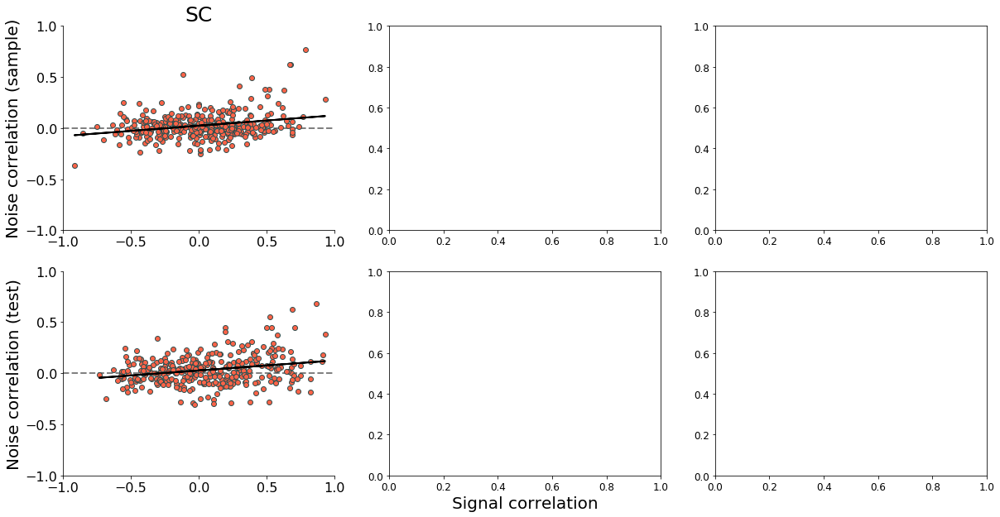

In [82]:
fig, ax =  plt.subplots(2, 3, figsize=(20, 10))

for i, area in enumerate(brain_areas[3:]):
    
    for ii, epoch in enumerate(epochs):
    
        noise = []
        for i_date in range(len(noise_correlations[epoch][area])):
            noise.append([np.nanmean(i) for i in noise_correlations[epoch][area][i_date] if len(i) > 0])
        noise = np.hstack(noise)

        signal = [i for i in np.hstack(signal_correlations[epoch][area]) if i != 0]
        
        m, b = np.polyfit(signal, noise, 1)

        ax[ii, i].plot([-1, 1], [0, 0], '--', color = 'grey', lw = 2, zorder=1)
        ax[ii, i].plot(signal, m*np.array(signal)+b, color = 'k', lw = 2, zorder = 2000)
        ax[ii, i].scatter(signal, noise, edgecolor = 'darkslategrey', facecolor = plot_colors[area], zorder=100)
        ax[ii, i].set_xlim(-1, 1)
        ax[ii, i].set_ylim(-1, 1)

        ax[ii, i].spines['right'].set_visible(False)
        ax[ii, i].spines['top'].set_visible(False)
        ax[ii, i].tick_params(labelsize=16)
        ax[0, i].set_title(area, fontsize = 25)
        
        print(sp.stats.pearsonr(signal, noise))

ax[0, 0].set_ylabel('Noise correlation (sample)', fontsize = 20)
ax[1, 0].set_ylabel('Noise correlation (test)', fontsize = 20)
ax[1, 1].set_xlabel('Signal correlation', fontsize = 20)

plt.show()

for i in save_filetype:
    savepath = figpath + 'noise_correlations\\' + monkey + '_signal_vs_noise_corrs.' + i
    #fig.savefig(savepath, bbox_inches='tight')


(0.2849799964825718, 5.987838383483158e-09)


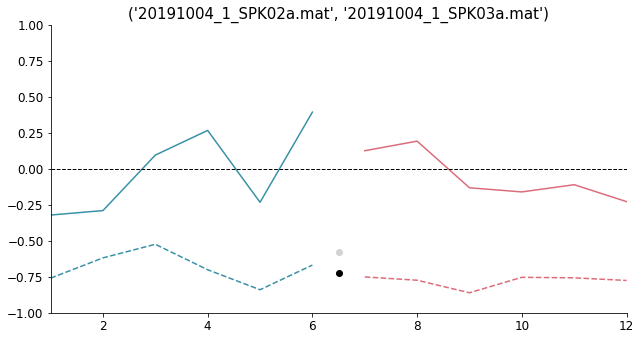

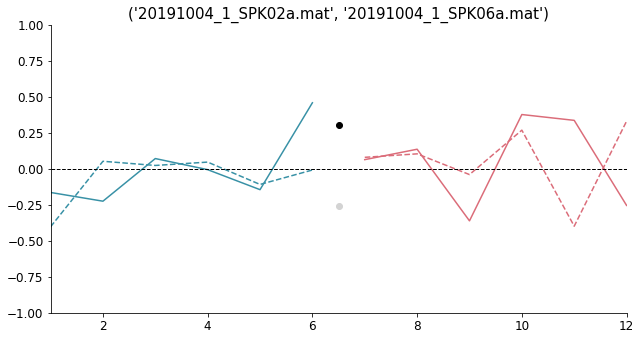

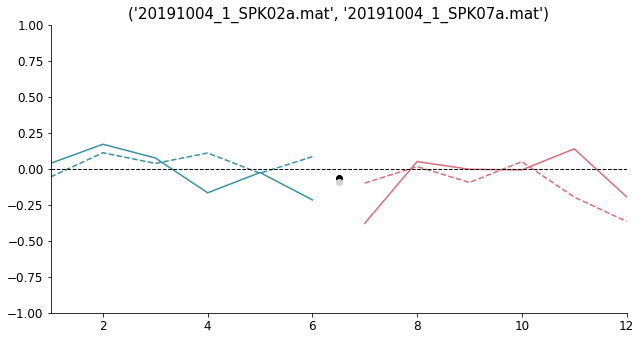

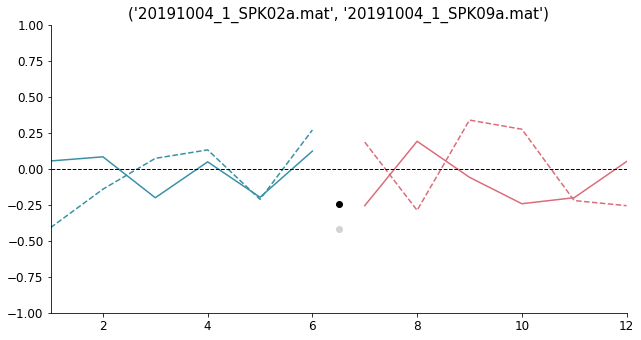

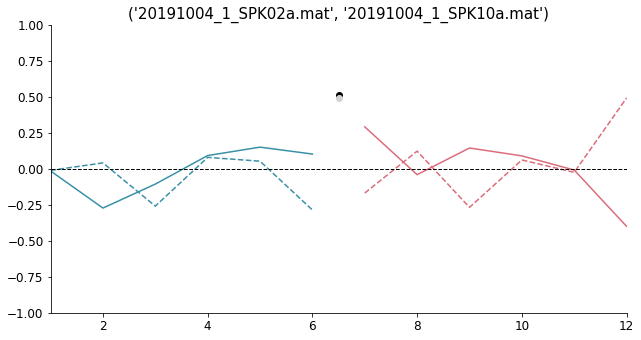

...

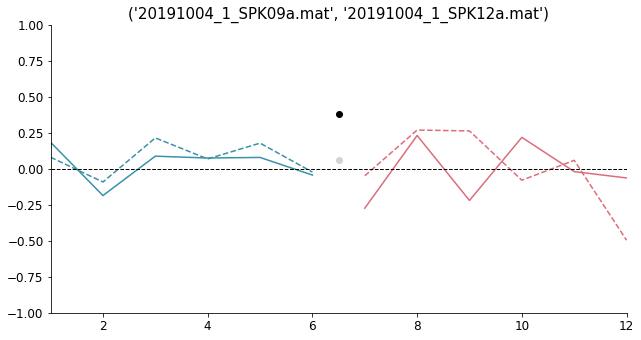

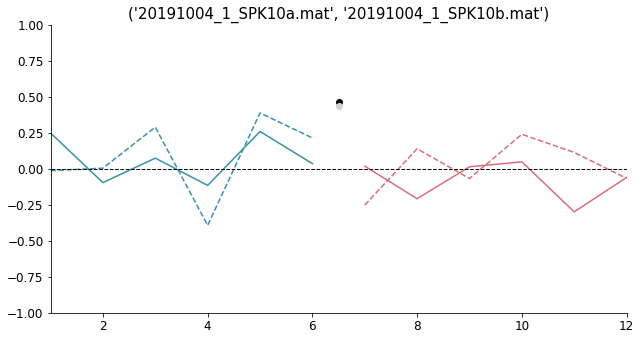

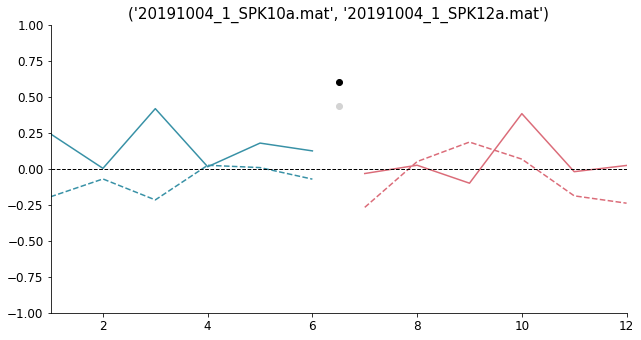

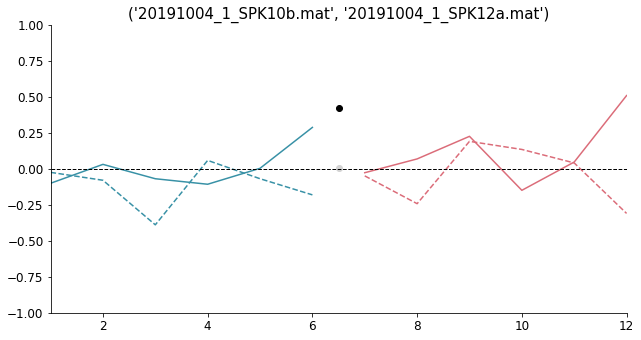

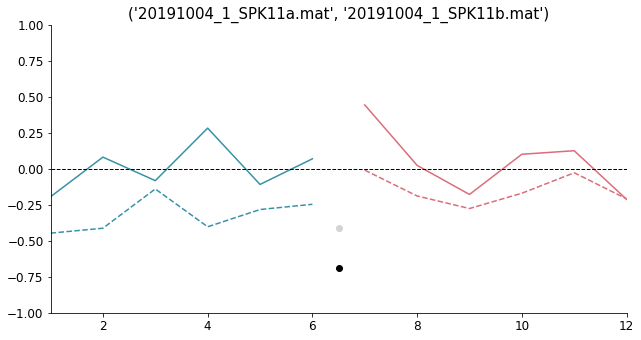

In [490]:
for i_pair in range(len(corrs_all_test)):
    
    if len(corrs_all_sample[i_pair]) > 0:

        fig = plt.figure(figsize=(8, 4))
        ax = fig.add_axes([1,1,1,1])
        ax.plot(range(1, 7), [i[0] for i in corrs_all_sample[i_pair][0:6]], color = plot_colors['Category1'])
        ax.plot(range(7, 13), [i[0] for i in corrs_all_sample[i_pair][6:12]], color = plot_colors['Category2'])

        ax.plot(range(1, 7), [i[0] for i in corrs_all_test[i_pair][0:6]], '--', color = plot_colors['Category1'])
        ax.plot(range(7, 13), [i[0] for i in corrs_all_test[i_pair][6:12]], '--', color = plot_colors['Category2'])
        
        ax.plot(6.5, sig_corr_sample[i_pair], 'ok')
        ax.plot(6.5, sig_corr_test[i_pair], 'o', color = 'lightgrey')
        
        ax.set_ylim(-1, 1)
        ax.set_xlim(1, 12)
        ax.plot([1, 12], [0, 0], '--k', lw = 1)

        # Hide the right and top spines
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)

        ax.set_title(neuron_pairs[i_pair], fontsize = 15)

        plt.show()


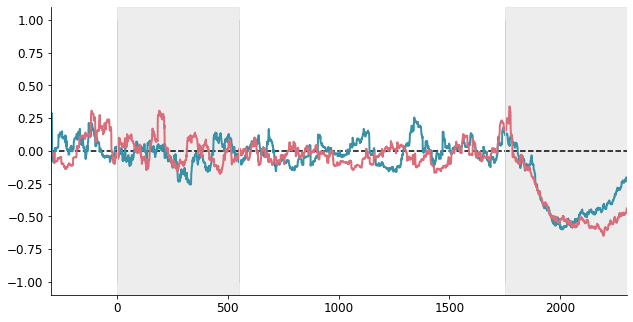

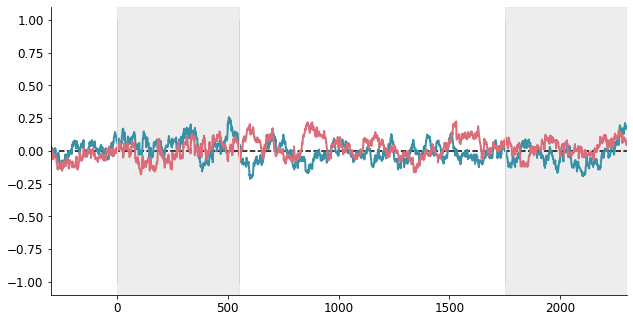

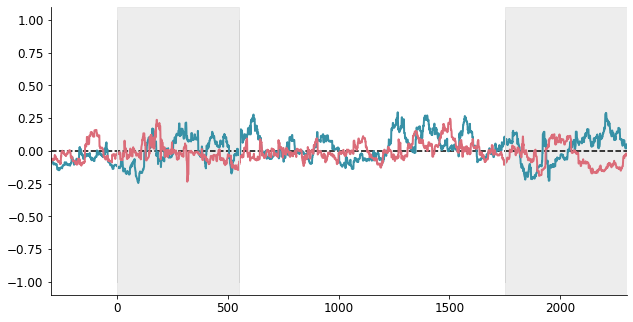

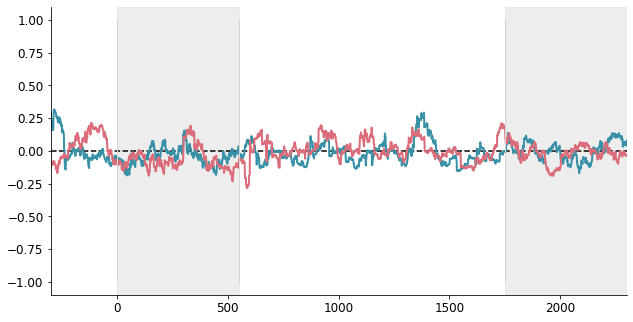

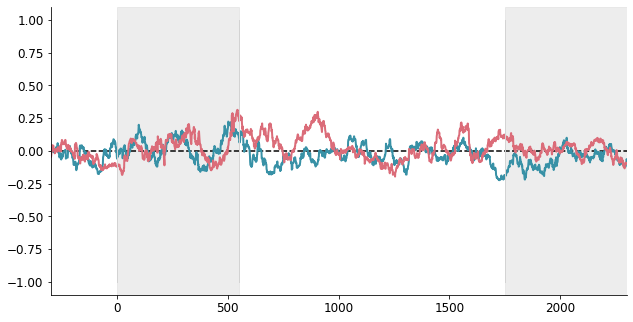

C:\Users\Barbara\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys


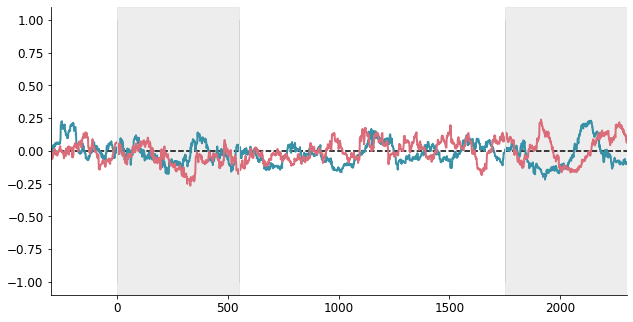

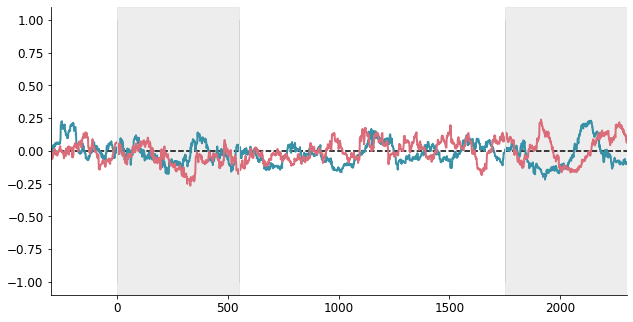

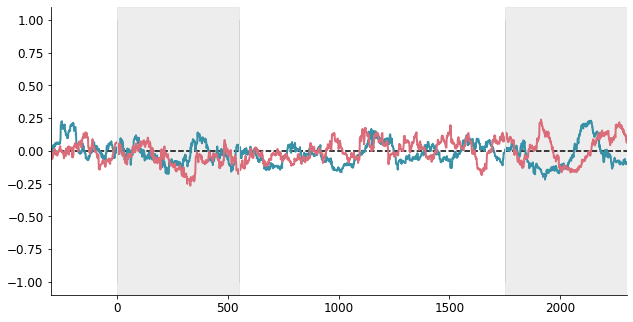

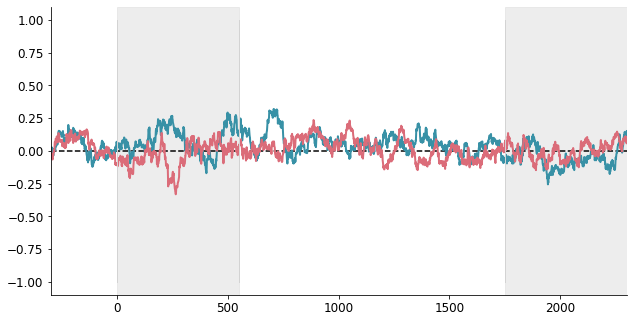

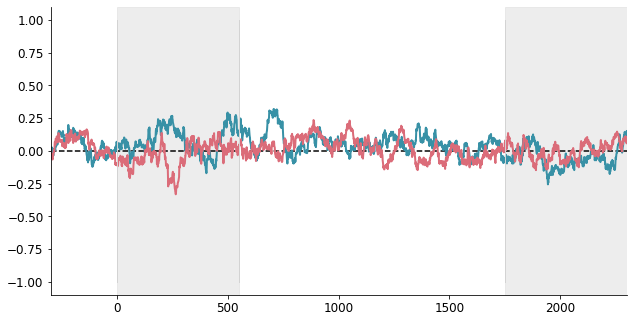

...

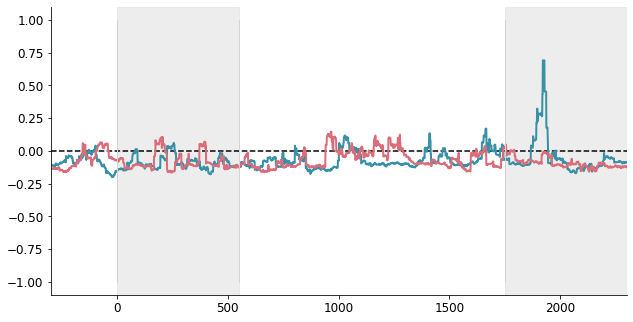

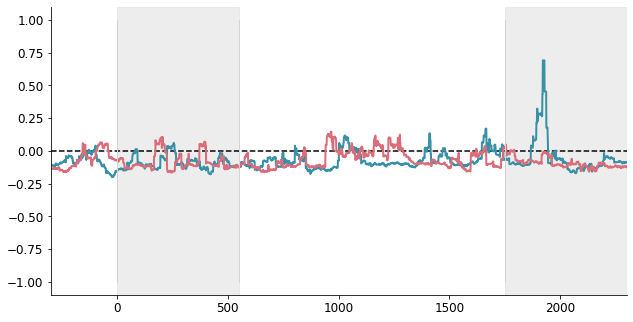

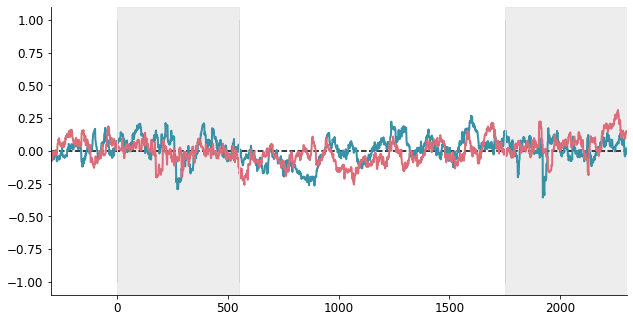

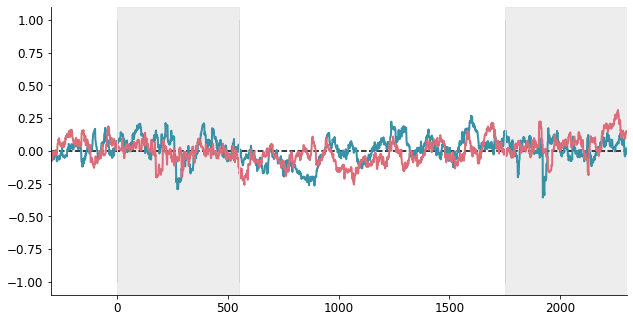

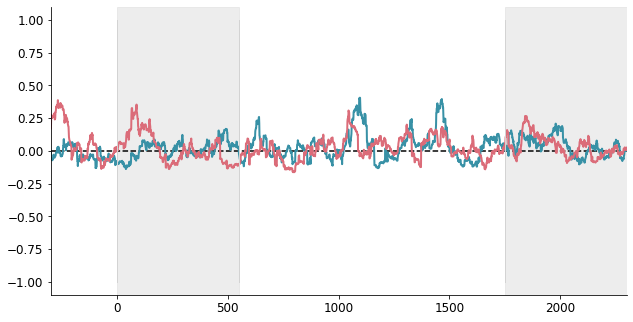

C:\Users\Barbara\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: Mean of empty slice
  


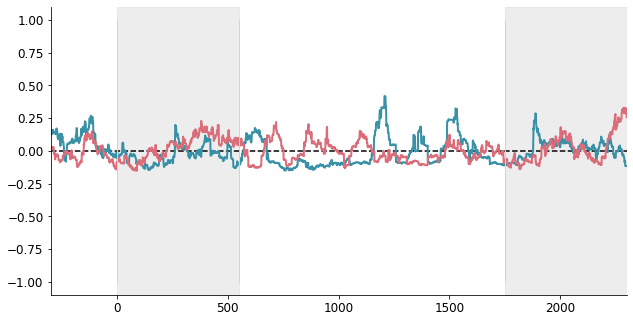

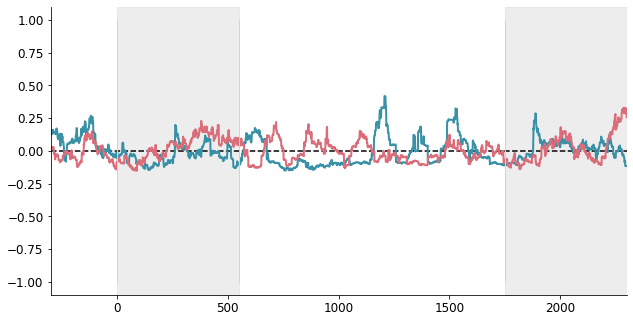

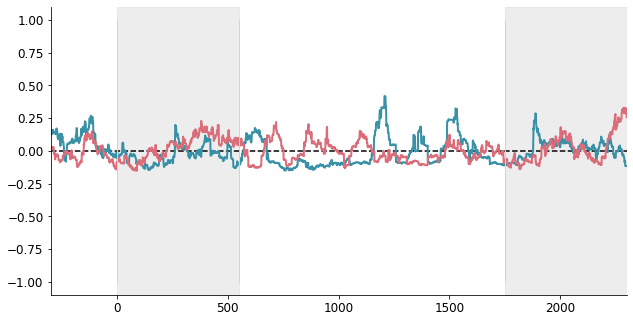

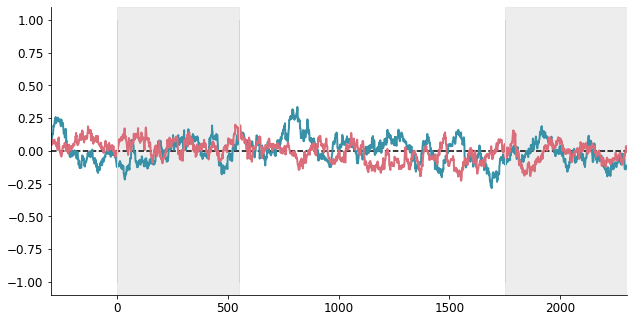

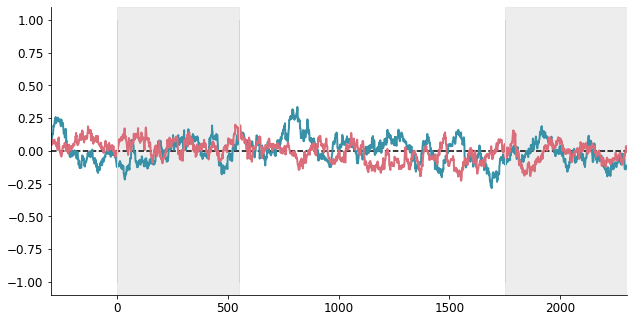

...

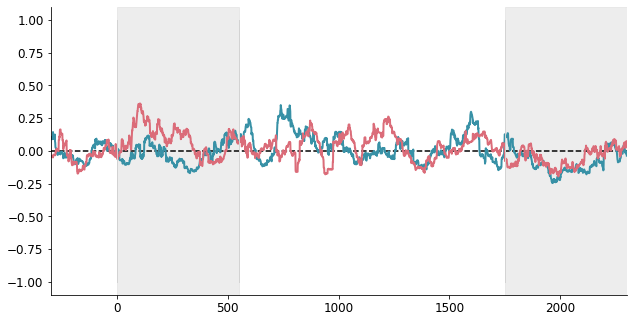

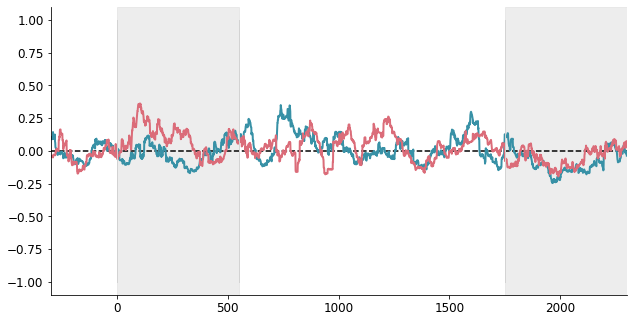

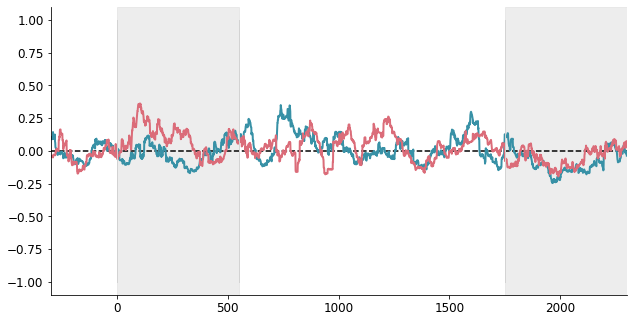

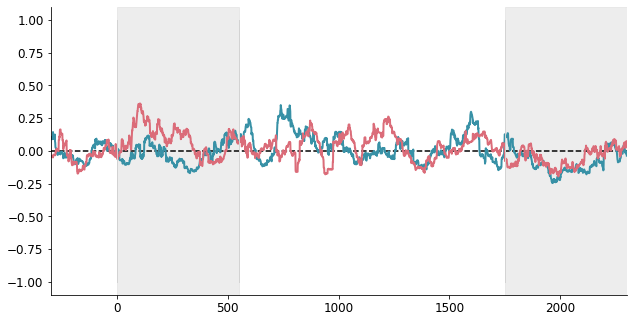

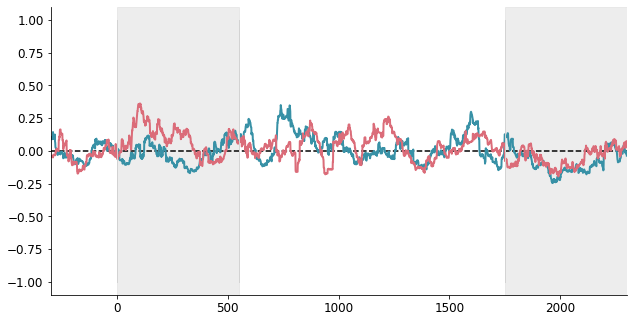

In [191]:
for i in range(len(corrs_all)):

    fig = plt.figure(figsize=(8, 4))
    ax = fig.add_axes([1,1,1,1])
    ax.plot([-300, 2300], [0, 0], '--k')
    ax.plot(bins[:-1], np.nanmean(corrs_all[i][0:6], 0), color = plot_colors['Category1'], lw = 2)
    ax.plot(bins[:-1], np.nanmean(corrs_all[i][6:12], 0), color = plot_colors['Category2'], lw = 2)

    ax.plot([0, 0], [-1, 1], 'lightgrey', lw = 1)
    for i in range(4):
        ax.plot([TRIAL_EPOCHS[i], TRIAL_EPOCHS[i]], [-1, 1], 'lightgrey', lw = 1)

    ax.axvspan(0, TRIAL_EPOCHS[0], alpha = 0.4, color = 'lightgrey', zorder=1)
    ax.axvspan(TRIAL_EPOCHS[1], TRIAL_EPOCHS[2], alpha = 0.4, color = 'lightgrey', zorder=2)
    plt.xlim((-300, 2300))

    # Hide the right and top spines
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
    plt.show()

In [94]:
data_by_dir1[0][:,2000]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0], dtype=int64)

In [102]:
data_by_dir1[0][:,2000]

array([0., 0., 0., 0., 0., 1., 4., 0., 0., 0., 2., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])